In [ ]:
# INSTALL LIBRARIES

print("="*80)
print("INSTALLING DEPENDENCIES")
print("="*80 + "\n")

!pip install -q opencv-python-headless tqdm scikit-learn seaborn pandas

INSTALLING DEPENDENCIES



In [ ]:
# SECTION 2: UNZIP & PREPROCESS ALL DATASETS

import os
import zipfile
import cv2
import numpy as np
from tqdm import tqdm

print("="*80)
print(" UNZIPPING YOUR UPLOADED DATASET")
print("="*80 + "\n")

ZIP_FILE_PATH = 'Figshare_Dataset_Clean.zip'
BASE_DATA_DIR = 'Figshare_Base_Dataset'

if os.path.exists(ZIP_FILE_PATH):
    print(f"Unzipping '{ZIP_FILE_PATH}'...")
    !unzip -q {ZIP_FILE_PATH} -d {BASE_DATA_DIR}

    nested_path = os.path.join(BASE_DATA_DIR, 'Figshare_Dataset')
    if os.path.exists(nested_path):
        print("Fixing nested folder structure...")
        !mv {nested_path}/* {BASE_DATA_DIR}/
        !rm -rf {nested_path}

    print(f"\n✅ Base dataset is ready at '{BASE_DATA_DIR}'")
    # Verify
    print("\nVerifying contents:")
    !ls -l {BASE_DATA_DIR}
else:
    print(f" ERROR: '{ZIP_FILE_PATH}' not found.")
    print("Please make sure you have uploaded the file and the name matches.")

 UNZIPPING YOUR UPLOADED DATASET

Unzipping 'Figshare_Dataset_Clean.zip'...
Fixing nested folder structure...

✅ Base dataset is ready at 'Figshare_Base_Dataset'

Verifying contents:
total 12
drwxr-xr-x 5 root root 4096 Nov 16 18:35 Testing
drwxr-xr-x 5 root root 4096 Nov 16 18:35 Training
drwxr-xr-x 5 root root 4096 Nov 16 18:35 Validation


In [ ]:
def apply_skull_stripping(img):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    _, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    kernel = np.ones((5,5), np.uint8)
    opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)
    sure_bg = cv2.dilate(opening, kernel, iterations=3)
    return cv2.bitwise_and(img, img, mask=sure_bg)

def apply_clahe(img):
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
    cl = clahe.apply(l)
    limg = cv2.merge((cl, a, b))
    return cv2.cvtColor(limg, cv2.COLOR_LAB2RGB)

def apply_denoising(img):
    return cv2.bilateralFilter(img, d=9, sigmaColor=75, sigmaSpace=75)


def create_preprocessed_dataset(func, source_dir, output_dir):
    !rm -rf {output_dir}
    print(f"\nCreating Dataset: {output_dir}")
    print("-" * 80)

    for split in ['Training', 'Validation', 'Testing']:
        split_path = os.path.join(source_dir, split)
        if not os.path.exists(split_path):
            print(f"Warning: {split_path} not found. Skipping.")
            continue

        for category in os.listdir(split_path):
            source_cat_dir = os.path.join(split_path, category)
            if not os.path.isdir(source_cat_dir):
                continue

            dest_cat_dir = os.path.join(output_dir, split, category)
            os.makedirs(dest_cat_dir, exist_ok=True)

            print(f"Processing: {split}/{category}")

            for filename in tqdm(os.listdir(source_cat_dir)):
                in_path = os.path.join(source_cat_dir, filename)
                out_path = os.path.join(dest_cat_dir, filename)

                try:
                    img = cv2.cvtColor(cv2.imread(in_path), cv2.COLOR_BGR2RGB)
                    processed = func(img)
                    cv2.imwrite(out_path, cv2.cvtColor(processed, cv2.COLOR_RGB2BGR))
                except Exception as e:
                    print(f"  Error processing {filename}: {e}")

    print(f"\n Dataset ready at '{output_dir}'\n")

print("\n" + "="*80)
print("CREATING PREPROCESSED DATASETS")
print("="*80 + "\n")

create_preprocessed_dataset(apply_skull_stripping, BASE_DATA_DIR, 'Skull_Stripped_Dataset')
create_preprocessed_dataset(apply_clahe, BASE_DATA_DIR, 'CLAHE_Dataset')
create_preprocessed_dataset(apply_denoising, BASE_DATA_DIR, 'Denoised_Dataset')

print("="*80)
print(" ALL PREPROCESSED DATASETS CREATED SUCCESSFULLY")
print("="*80 + "\n")


CREATING PREPROCESSED DATASETS


Creating Dataset: Skull_Stripped_Dataset
--------------------------------------------------------------------------------
Processing: Training/pituitary


100%|██████████| 648/648 [00:08<00:00, 74.00it/s]


Processing: Training/glioma


100%|██████████| 1002/1002 [00:07<00:00, 139.27it/s]


Processing: Training/meningioma


100%|██████████| 509/509 [00:02<00:00, 176.52it/s]


Processing: Validation/pituitary


100%|██████████| 130/130 [00:00<00:00, 174.99it/s]


Processing: Validation/glioma


100%|██████████| 223/223 [00:01<00:00, 177.67it/s]


Processing: Validation/meningioma


100%|██████████| 80/80 [00:00<00:00, 119.69it/s]


Processing: Testing/pituitary


100%|██████████| 152/152 [00:00<00:00, 172.58it/s]


Processing: Testing/glioma


100%|██████████| 201/201 [00:01<00:00, 183.43it/s]


Processing: Testing/meningioma


100%|██████████| 119/119 [00:00<00:00, 181.14it/s]



 Dataset ready at 'Skull_Stripped_Dataset'


Creating Dataset: CLAHE_Dataset
--------------------------------------------------------------------------------
Processing: Training/pituitary


100%|██████████| 648/648 [00:06<00:00, 100.20it/s]


Processing: Training/glioma


100%|██████████| 1002/1002 [00:08<00:00, 118.33it/s]


Processing: Training/meningioma


100%|██████████| 509/509 [00:04<00:00, 106.23it/s]


Processing: Validation/pituitary


100%|██████████| 130/130 [00:01<00:00, 116.93it/s]


Processing: Validation/glioma


100%|██████████| 223/223 [00:01<00:00, 124.84it/s]


Processing: Validation/meningioma


100%|██████████| 80/80 [00:00<00:00, 122.28it/s]


Processing: Testing/pituitary


100%|██████████| 152/152 [00:01<00:00, 121.20it/s]


Processing: Testing/glioma


100%|██████████| 201/201 [00:01<00:00, 123.55it/s]


Processing: Testing/meningioma


100%|██████████| 119/119 [00:01<00:00, 82.42it/s]



 Dataset ready at 'CLAHE_Dataset'


Creating Dataset: Denoised_Dataset
--------------------------------------------------------------------------------
Processing: Training/pituitary


100%|██████████| 648/648 [00:25<00:00, 25.01it/s]


Processing: Training/glioma


100%|██████████| 1002/1002 [00:41<00:00, 24.30it/s]


Processing: Training/meningioma


100%|██████████| 509/509 [00:20<00:00, 24.25it/s]


Processing: Validation/pituitary


100%|██████████| 130/130 [00:04<00:00, 26.75it/s]


Processing: Validation/glioma


100%|██████████| 223/223 [00:09<00:00, 24.37it/s]


Processing: Validation/meningioma


100%|██████████| 80/80 [00:02<00:00, 26.99it/s]


Processing: Testing/pituitary


100%|██████████| 152/152 [00:06<00:00, 23.08it/s]


Processing: Testing/glioma


100%|██████████| 201/201 [00:07<00:00, 27.21it/s]


Processing: Testing/meningioma


100%|██████████| 119/119 [00:05<00:00, 22.34it/s]


 Dataset ready at 'Denoised_Dataset'

 ALL PREPROCESSED DATASETS CREATED SUCCESSFULLY



In [ ]:
from google.colab import files
import time

print("="*80)
print(" ZIPPING ALL DATASETS FOR DOWNLOAD")
print("="*80 + "\n")

# --- 1. Zip Base Dataset ---
print("Zipping Figshare_Base_Dataset... (This will be your 'Baseline' data)")
!zip -rq Figshare_Base_Dataset.zip Figshare_Base_Dataset

# --- 2. Zip Skull-Stripped Dataset ---
print("Zipping Skull_Stripped_Dataset...")
!zip -rq Skull_Stripped_Dataset.zip Skull_Stripped_Dataset

# --- 3. Zip CLAHE Dataset ---
print("Zipping CLAHE_Dataset...")
!zip -rq CLAHE_Dataset.zip CLAHE_Dataset

# --- 4. Zip Denoised Dataset ---
print("Zipping Denoised_Dataset...")
!zip -rq Denoised_Dataset.zip Denoised_Dataset

print("\n" + "="*80)
print("  ALL 4 DATASETS ZIPPED.")
print("="*80 + "\n")

print("Starting downloads. This may take a while and require you to click 'Allow' in your browser.")

# Start all downloads
files.download('Figshare_Base_Dataset.zip')
files.download('Skull_Stripped_Dataset.zip')
files.download('CLAHE_Dataset.zip')
files.download('Denoised_Dataset.zip')

print("\n--- All download requests sent! ---")

 ZIPPING ALL DATASETS FOR DOWNLOAD

Zipping Figshare_Base_Dataset... (This will be your 'Baseline' data)
Zipping Skull_Stripped_Dataset...
Zipping CLAHE_Dataset...
Zipping Denoised_Dataset...

  ALL 4 DATASETS ZIPPED.

Starting downloads. This may take a while and require you to click 'Allow' in your browser.


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


--- All download requests sent! ---


In [ ]:
# DEFINE THE  MASTER TRAINING FUNCTION

import tensorflow as tf
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger, ReduceLROnPlateau, EarlyStopping
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, precision_recall_fscore_support
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import time
import os
import cv2
import numpy as np
import random

# --- REPRODUCIBILITY SETUP ---

SEED = 42
os.environ['PYTHONHASHSEED'] = str(SEED)
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

def run_experiment(data_dir, use_augmentation):
    """
    Complete training and evaluation pipeline with all enhancements.
    FIXED:
    - Uses the dedicated Validation/ folder (no validation_split)
    - Correctly combines training history after EarlyStopping
    - Correctly gets y_true_labels for test set
    - FIXED 'num_samples' NameError
    """

    VERSION = f"Lab_Run_{data_dir}_{'WithAug' if use_augmentation else 'NoAug'}"

    print("\n" + "="*80)
    print(f" STARTING EXPERIMENT: {VERSION}")
    print("="*80 + "\n")

    # Start timing
    experiment_start_time = time.time()

    TOTAL_EPOCHS = 100
    BATCH_SIZE = 32
    IMAGE_SIZE = (224, 224)

    TRAIN_PATH = os.path.join(data_dir, 'Training/')
    VALIDATION_PATH = os.path.join(data_dir, 'Validation/')
    TEST_PATH = os.path.join(data_dir, 'Testing/')


    # Data generators
    if use_augmentation:
        print(" Data Augmentation: ENABLED")
        train_datagen = ImageDataGenerator(
            rescale=1./255,
            rotation_range=30,
            width_shift_range=0.2,
            height_shift_range=0.2,
            shear_range=0.2,
            zoom_range=0.2,
            horizontal_flip=True,
            fill_mode='nearest'
        )
    else:
        print(" Data Augmentation: DISABLED")
        train_datagen = ImageDataGenerator(rescale=1./255)

    # Validation/Test generator (only rescaling)
    validation_datagen = ImageDataGenerator(rescale=1./255)
    test_datagen = ImageDataGenerator(rescale=1./255)

    train_generator = train_datagen.flow_from_directory(
        TRAIN_PATH, target_size=IMAGE_SIZE, batch_size=BATCH_SIZE,
        class_mode='categorical'
    )

    validation_generator = validation_datagen.flow_from_directory(
        VALIDATION_PATH, target_size=IMAGE_SIZE, batch_size=BATCH_SIZE,
        class_mode='categorical', shuffle=False
    )

    test_generator = test_datagen.flow_from_directory(
        TEST_PATH, target_size=IMAGE_SIZE, batch_size=BATCH_SIZE,
        class_mode='categorical', shuffle=False
    )

    class_names = list(train_generator.class_indices.keys())
    print(f" Classes: {class_names} (Total: {len(class_names)})")
    print(f" Training samples: {train_generator.samples}")
    print(f" Validation samples: {validation_generator.samples}")
    print(f" Test samples: {test_generator.samples}\n")

    # Model creation
    def create_model(output_size):
        base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
        base_model.trainable = False

        x = Flatten()(base_model.output)
        x = Dense(512, activation='relu')(x)
        x = Dropout(0.6)(x)
        x = Dense(256, activation='relu')(x)
        x = Dropout(0.5)(x)
        output = Dense(output_size, activation='softmax')(x)

        return Model(inputs=base_model.input, outputs=output)

    model = create_model(output_size=len(class_names))
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    model_dir = f"{VERSION}/"
    os.makedirs(model_dir, exist_ok=True)

    # Callbacks with EarlyStopping
    callbacks = [
        ModelCheckpoint(
            f"{model_dir}best_model.h5",
            monitor='val_loss',
            save_best_only=True,
            mode='min',
            verbose=1
        ),
        CSVLogger(f'{model_dir}training_log.csv'),
        ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.2,
            patience=5,
            min_lr=1e-6,
            verbose=1
        ),
        EarlyStopping(
            monitor='val_loss',
            patience=15,
            restore_best_weights=False,
            verbose=1
        )
    ]

    # Stage 1: Frozen training
    print("="*80)
    print(" STAGE 1: Training with frozen VGG16 base")
    print("="*80 + "\n")

    stage1_epochs = int(TOTAL_EPOCHS * 0.4)
    history = model.fit(
        train_generator,
        validation_data=validation_generator,
        epochs=stage1_epochs,
        callbacks=callbacks
    )

    # if Stage 2 should run
    history_fine_tune = None
    if len(history.epoch) == stage1_epochs:
        # Stage 2: Fine-tuning
        print("\n" + "="*80)
        print(" STAGE 2: Fine-tuning from block4_conv1")
        print("="*80 + "\n")

        set_trainable = False
        for layer in model.layers:
            if layer.name == 'block4_conv1':
                set_trainable = True
            if set_trainable:
                layer.trainable = True

        model.compile(
            optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
            loss='categorical_crossentropy',
            metrics=['accuracy']
        )

        initial_epoch = history.epoch[-1] + 1 if history.epoch else 0
        history_fine_tune = model.fit(
            train_generator,
            epochs=TOTAL_EPOCHS,
            initial_epoch=initial_epoch,
            validation_data=validation_generator,
            callbacks=callbacks
        )
    else:
        print("\n" + "="*80)
        print(" EarlyStopping triggered in Stage 1. Skipping Stage 2.")
        print("="*80 + "\n")

    # Calculate training time
    experiment_end_time = time.time()
    training_duration = experiment_end_time - experiment_start_time
    hours = int(training_duration // 3600)
    minutes = int((training_duration % 3600) // 60)
    seconds = int(training_duration % 60)

    print("\n" + "="*80)
    print(f" TRAINING COMPLETED: {hours}h {minutes}m {seconds}s")
    print("="*80 + "\n")

    # Save training time
    with open(f"{model_dir}training_time.txt", "w") as f:
        f.write(f"Total Training Time: {hours}h {minutes}m {seconds}s\n")
        f.write(f"Total Seconds: {training_duration:.2f}s\n")

    # VISUALIZATION AND EVALUATION

    # Correctly combine histories
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    if history_fine_tune is not None:
        acc.extend(history_fine_tune.history['accuracy'])
        val_acc.extend(history_fine_tune.history['val_accuracy'])
        loss.extend(history_fine_tune.history['loss'])
        val_loss.extend(history_fine_tune.history['val_loss'])

    # Calculate overfitting gap
    final_train_acc = acc[-1]
    final_val_acc = val_acc[-1]
    overfitting_gap = (final_train_acc - final_val_acc) * 100

    print("="*80)
    print(" OVERFITTING ANALYSIS")
    print("="*80)
    print(f"Final Training Accuracy: {final_train_acc:.4f}")
    print(f"Final Validation Accuracy: {final_val_acc:.4f}")
    print(f"Overfitting Gap: {overfitting_gap:.2f}%")
    print("="*80 + "\n")

    with open(f"{model_dir}overfitting_metrics.txt", "w") as f:
        f.write(f"Training Accuracy: {final_train_acc:.4f}\n")
        f.write(f"Validation Accuracy: {final_val_acc:.4f}\n")
        f.write(f"Overfitting Gap: {overfitting_gap:.2f}%\n")
        f.write(f"Total Epochs Trained: {len(acc)}\n")

    # Training plots
    plt.figure(figsize=(16, 6))

    plt.subplot(1, 2, 1)
    plt.plot(acc, label='Training Accuracy', linewidth=2)
    plt.plot(val_acc, label='Validation Accuracy', linewidth=2)
    plt.title(f'Accuracy - {VERSION}', fontsize=14, fontweight='bold')
    plt.xlabel('Epoch', fontsize=12)
    plt.ylabel('Accuracy', fontsize=12)
    plt.legend(fontsize=11)
    plt.grid(True, alpha=0.3)

    plt.subplot(1, 2, 2)
    plt.plot(loss, label='Training Loss', linewidth=2)
    plt.plot(val_loss, label='Validation Loss', linewidth=2)
    plt.title(f'Loss - {VERSION}', fontsize=14, fontweight='bold')
    plt.xlabel('Epoch', fontsize=12)
    plt.ylabel('Loss', fontsize=12)
    plt.legend(fontsize=11)
    plt.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.savefig(f"{model_dir}training_plots.png", dpi=300, bbox_inches='tight')
    plt.show()

    print(f" Training plots saved\n")

    # Load best model
    print("="*80)
    print(" LOADING BEST MODEL FOR EVALUATION")
    print("="*80 + "\n")

    best_model = tf.keras.models.load_model(f"{model_dir}best_model.h5")

    # Predictions
    print("--- Evaluating on Test Set ---")
    y_pred_probs = best_model.predict(test_generator, verbose=1)
    y_pred_labels = np.argmax(y_pred_probs, axis=1)

    # This is the robust way to get true labels
    y_true_labels = test_generator.classes

    # Classification report
    report = classification_report(y_true_labels, y_pred_labels, target_names=class_names)
    print("\n" + "="*80)
    print(" CLASSIFICATION REPORT")
    print("="*80 + "\n")
    print(report)

    with open(f"{model_dir}classification_report.txt", "w") as f:
        f.write(report)

    # Per-class metrics CSV
    precision, recall, f1, support = precision_recall_fscore_support(
        y_true_labels, y_pred_labels, average=None, labels=range(len(class_names))
    )

    df_metrics = pd.DataFrame({
        'Class': class_names,
        'Precision': precision,
        'Recall': recall,
        'F1-Score': f1,
        'Support': support
    })
    df_metrics.to_csv(f"{model_dir}per_class_metrics.csv", index=False)
    print(f" Per-class metrics saved to CSV\n")

    # Confusion Matrix
    print("="*80)
    print(" GENERATING CONFUSION MATRIX")
    print("="*80 + "\n")

    cm = confusion_matrix(y_true_labels, y_pred_labels)
    plt.figure(figsize=(10, 8))
    sns.heatmap(
        cm,
        annot=True,
        fmt='d',
        cmap='Blues',
        xticklabels=class_names,
        yticklabels=class_names,
        cbar_kws={'label': 'Count'},
        linewidths=0.5
    )
    plt.title(f'Confusion Matrix - {VERSION}', fontsize=14, fontweight='bold', pad=20)
    plt.xlabel('Predicted Label', fontsize=12)
    plt.ylabel('True Label', fontsize=12)
    plt.tight_layout()
    plt.savefig(f"{model_dir}confusion_matrix.png", dpi=300, bbox_inches='tight')
    plt.show()

    print(f" Confusion matrix saved\n")

    # ROC-AUC Curves
    print("="*80)
    print(" GENERATING ROC-AUC CURVES")
    print("="*80 + "\n")

    y_true_bin = label_binarize(y_true_labels, classes=range(len(class_names)))

    plt.figure(figsize=(10, 8))

    auc_scores = []
    for i, class_name in enumerate(class_names):
        fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_probs[:, i])
        roc_auc = auc(fpr, tpr)
        auc_scores.append(roc_auc)
        plt.plot(fpr, tpr, lw=2, label=f'{class_name} (AUC = {roc_auc:.3f})')

    plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Chance')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate', fontsize=12)
    plt.ylabel('True Positive Rate', fontsize=12)
    plt.title(f'ROC Curves - {VERSION}', fontsize=14, fontweight='bold')
    plt.legend(loc="lower right", fontsize=10)
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.savefig(f"{model_dir}roc_curves.png", dpi=300, bbox_inches='tight')
    plt.show()

    # Save AUC scores
    mean_auc = np.mean(auc_scores)
    with open(f"{model_dir}auc_scores.txt", "w") as f:
        f.write("Per-Class AUC Scores:\n")
        f.write("-" * 40 + "\n")
        for class_name, auc_score in zip(class_names, auc_scores):
            f.write(f"{class_name}: {auc_score:.4f}\n")
        f.write("-" * 40 + "\n")
        f.write(f"Mean AUC: {mean_auc:.4f}\n")

    print(f" ROC curves saved")
    print(f"   Mean AUC: {mean_auc:.4f}\n")

    # GRAD-CAM VISUALIZATIONS

    print("="*80)
    print(" GENERATING GRAD-CAM VISUALIZATIONS")
    print("="*80 + "\n")

    def get_gradcam(model, img_array, layer_name):
        grad_model = Model([model.inputs], [model.get_layer(layer_name).output, model.output])
        with tf.GradientTape() as tape:
            conv_outputs, predictions = grad_model(img_array)
            class_idx = tf.argmax(predictions[0])
            loss = predictions[:, class_idx]
        grads = tape.gradient(loss, conv_outputs)[0]
        weights = tf.reduce_mean(grads, axis=(0, 1))
        cam = np.dot(conv_outputs[0], weights)
        cam = np.maximum(cam, 0)
        cam = cv2.resize(cam, (224, 224))
        cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
        return cam

    def overlay_gradcam(img, cam):
        heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
        heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
        return cv2.addWeighted(np.uint8(255 * img), 0.6, heatmap, 0.4, 0)

    last_conv_layer = [l.name for l in best_model.layers if "conv" in l.name][-1]
    print(f"Using layer: {last_conv_layer}\n")

    # Grad-CAM Grid (6 samples)
    print("Generating 6-sample Grad-CAM grid...")

    # Reset generator to get fresh batch
    test_generator.reset()
    X_batch, y_batch = next(test_generator)

    num_samples = 6

    fig = plt.figure(figsize=(16, 11))

    # Use min() to prevent errors if batch is smaller than num_samples
    for i in range(min(num_samples, len(X_batch))):
        img = X_batch[i]
        img_batch = np.expand_dims(img, axis=0)

        cam = get_gradcam(best_model, img_batch, last_conv_layer)
        overlay = overlay_gradcam(img, cam)

        true_class = class_names[np.argmax(y_batch[i])]
        pred_probs = best_model.predict(img_batch, verbose=0)
        pred_class = class_names[np.argmax(pred_probs)]
        confidence = np.max(pred_probs) * 100

        is_correct = (true_class == pred_class)
        title_color = 'green' if is_correct else 'red'

        plt.subplot(2, 3, i+1)
        plt.imshow(overlay)
        plt.title(
            f"True: {true_class}\nPred: {pred_class} ({confidence:.1f}%)",
            fontsize=11,
            fontweight='bold',
            color=title_color
        )
        plt.axis("off")

    test_generator.reset()
    plt.suptitle(f"Grad-CAM Grid - {VERSION}", fontsize=16, fontweight='bold', y=0.98)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.savefig(f"{model_dir}grad_cam_grid.png", dpi=300, bbox_inches='tight')
    plt.show()

    print(f" Grad-CAM grid saved\n")

    # Per-Class Grad-CAM
    print("Generating per-class Grad-CAM...")

    test_generator.reset()
    selected_images = []
    selected_labels = []

    for class_idx, class_name in enumerate(class_names):
        class_mask = (test_generator.classes == class_idx)
        class_indices = np.where(class_mask)[0]

        found = False
        if len(class_indices) > 0:
            for idx in class_indices:
                batch_idx = idx // test_generator.batch_size
                in_batch_idx = idx % test_generator.batch_size

                # Manually get the batch
                test_generator.reset()
                for _ in range(batch_idx + 1):
                    X_batch, y_batch = next(test_generator)

                img = X_batch[in_batch_idx]
                img_batch = np.expand_dims(img, axis=0)
                pred = best_model.predict(img_batch, verbose=0)

                if np.argmax(pred) == class_idx:
                    selected_images.append(img)
                    selected_labels.append(class_name)
                    found = True
                    break

        if not found and len(class_indices) > 0:
            idx = class_indices[0]
            batch_idx = idx // test_generator.batch_size
            in_batch_idx = idx % test_generator.batch_size
            test_generator.reset()
            for _ in range(batch_idx + 1):
                X_batch, y_batch = next(test_generator)
            selected_images.append(X_batch[in_batch_idx])
            selected_labels.append(class_name + " (Misclassified)")
        elif not found:
            print(f"Warning: No test images found for class {class_name}")

    test_generator.reset()

    if selected_images:
        fig = plt.figure(figsize=(16, 5))
        num_classes_found = len(selected_images)
        for i, (img, label) in enumerate(zip(selected_images, selected_labels)):
            img_batch = np.expand_dims(img, axis=0)

            cam = get_gradcam(best_model, img_batch, last_conv_layer)
            overlay = overlay_gradcam(img, cam)

            pred_probs = best_model.predict(img_batch, verbose=0)
            confidence = np.max(pred_probs) * 100

            plt.subplot(1, num_classes_found, i+1)
            plt.imshow(overlay)
            plt.title(f"{label}\n({confidence:.1f}%)", fontsize=12, fontweight='bold')
            plt.axis("off")

        plt.suptitle(f"Per-Class Grad-CAM - {VERSION}", fontsize=16, fontweight='bold')
        plt.tight_layout()
        plt.savefig(f"{model_dir}grad_cam_per_class.png", dpi=300, bbox_inches='tight')
        plt.show()
    else:
        print("Could not generate per-class Grad-CAM.")

    print(f" Per-class Grad-CAM saved\n")

    # FINAL SUMMARY

    print("="*80)
    print(f" EXPERIMENT COMPLETE: {VERSION}")
    print("="*80)
    print(f" All results saved to: {model_dir}")
    print(f" Total time: {hours}h {minutes}m {seconds}s")
    print(f" Test Accuracy: {np.mean(y_pred_labels == y_true_labels):.4f}")
    print(f" Mean AUC: {mean_auc:.4f}")
    print(f" Overfitting Gap: {overfitting_gap:.2f}%")
    print("="*80 + "\n\n")

print("="*80)
print(" COMPLETE TRAINING FUNCTION LOADED SUCCESSFULLY")
print("="*80)

 COMPLETE TRAINING FUNCTION LOADED SUCCESSFULLY



 STARTING EXPERIMENT: Lab_Run_Figshare_Base_Dataset_NoAug

 Data Augmentation: DISABLED
Found 2159 images belonging to 3 classes.
Found 433 images belonging to 3 classes.
Found 472 images belonging to 3 classes.
 Classes: ['glioma', 'meningioma', 'pituitary'] (Total: 3)
 Training samples: 2159
 Validation samples: 433
 Test samples: 472

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
 STAGE 1: Training with frozen VGG16 base



/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step - accuracy: 0.5125 - loss: 3.0474
Epoch 1: val_loss improved from inf to 0.45730, saving model to Lab_Run_Figshare_Base_Dataset_NoAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 44s 420ms/step - accuracy: 0.5138 - loss: 3.0304 - val_accuracy: 0.7921 - val_loss: 0.4573 - learning_rate: 0.0010
Epoch 2/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - accuracy: 0.7015 - loss: 0.6951
Epoch 2: val_loss improved from 0.45730 to 0.41588, saving model to Lab_Run_Figshare_Base_Dataset_NoAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 13s 189ms/step - accuracy: 0.7015 - loss: 0.6947 - val_accuracy: 0.8152 - val_loss: 0.4159 - learning_rate: 0.0010
Epoch 3/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - accuracy: 0.7491 - loss: 0.5692
Epoch 3: val_loss improved from 0.41588 to 0.38031, saving model to Lab_Run_Figshare_Base_Dataset_NoAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 13s 190ms/step - accuracy: 0.7489 - loss: 0.5691 - val_accuracy: 0.8176 - val_loss: 0.3803 - learning_rate: 0.0010
Epoch 4/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - accuracy: 0.7548 - loss: 0.5405
Epoch 4: val_loss improved from 0.38031 to 0.32177, saving model to Lab_Run_Figshare_Base_Dataset_NoAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 13s 191ms/step - accuracy: 0.7549 - loss: 0.5403 - val_accuracy: 0.8545 - val_loss: 0.3218 - learning_rate: 0.0010
Epoch 5/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - accuracy: 0.7518 - loss: 0.5433
Epoch 5: val_loss improved from 0.32177 to 0.30488, saving model to Lab_Run_Figshare_Base_Dataset_NoAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 13s 192ms/step - accuracy: 0.7521 - loss: 0.5430 - val_accuracy: 0.8684 - val_loss: 0.3049 - learning_rate: 0.0010
Epoch 6/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - accuracy: 0.7823 - loss: 0.4981
Epoch 6: val_loss did not improve from 0.30488
68/68 ━━━━━━━━━━━━━━━━━━━━ 13s 186ms/step - accuracy: 0.7822 - loss: 0.4983 - val_accuracy: 0.8707 - val_loss: 0.3134 - learning_rate: 0.0010
Epoch 7/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - accuracy: 0.7797 - loss: 0.4669
Epoch 7: val_loss improved from 0.30488 to 0.28810, saving model to Lab_Run_Figshare_Base_Dataset_NoAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 13s 195ms/step - accuracy: 0.7799 - loss: 0.4666 - val_accuracy: 0.8822 - val_loss: 0.2881 - learning_rate: 0.0010
Epoch 8/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - accuracy: 0.8001 - loss: 0.4389
Epoch 8: val_loss did not improve from 0.28810
68/68 ━━━━━━━━━━━━━━━━━━━━ 13s 189ms/step - accuracy: 0.8000 - loss: 0.4389 - val_accuracy: 0.8383 - val_loss: 0.3959 - learning_rate: 0.0010
Epoch 9/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - accuracy: 0.7902 - loss: 0.4740
Epoch 9: val_loss improved from 0.28810 to 0.26524, saving model to Lab_Run_Figshare_Base_Dataset_NoAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 14s 199ms/step - accuracy: 0.7904 - loss: 0.4738 - val_accuracy: 0.8799 - val_loss: 0.2652 - learning_rate: 0.0010
Epoch 10/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - accuracy: 0.7828 - loss: 0.4443
Epoch 10: val_loss did not improve from 0.26524
68/68 ━━━━━━━━━━━━━━━━━━━━ 13s 191ms/step - accuracy: 0.7829 - loss: 0.4442 - val_accuracy: 0.8476 - val_loss: 0.3064 - learning_rate: 0.0010
Epoch 11/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - accuracy: 0.8231 - loss: 0.4241
Epoch 11: val_loss improved from 0.26524 to 0.25805, saving model to Lab_Run_Figshare_Base_Dataset_NoAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 14s 199ms/step - accuracy: 0.8231 - loss: 0.4241 - val_accuracy: 0.8845 - val_loss: 0.2581 - learning_rate: 0.0010
Epoch 12/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - accuracy: 0.8181 - loss: 0.4139
Epoch 12: val_loss did not improve from 0.25805
68/68 ━━━━━━━━━━━━━━━━━━━━ 13s 192ms/step - accuracy: 0.8178 - loss: 0.4142 - val_accuracy: 0.8360 - val_loss: 0.3786 - learning_rate: 0.0010
Epoch 13/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - accuracy: 0.7888 - loss: 0.4272
Epoch 13: val_loss did not improve from 0.25805
68/68 ━━━━━━━━━━━━━━━━━━━━ 13s 193ms/step - accuracy: 0.7888 - loss: 0.4271 - val_accuracy: 0.8614 - val_loss: 0.3188 - learning_rate: 0.0010
Epoch 14/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - accuracy: 0.7894 - loss: 0.4153
Epoch 14: val_loss did not improve from 0.25805
68/68 ━━━━━━━━━━━━━━━━━━━━ 13s 193ms/step - accuracy: 0.7895 - loss: 0.4151 - val_accuracy: 0.8453 - val_loss: 0.3639 - learning_rate: 0.0010
Epoch 15/40
68/68 ━━━━━━━━━

68/68 ━━━━━━━━━━━━━━━━━━━━ 14s 201ms/step - accuracy: 0.8010 - loss: 0.3870 - val_accuracy: 0.8799 - val_loss: 0.2410 - learning_rate: 0.0010
Epoch 16/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - accuracy: 0.8031 - loss: 0.3962
Epoch 16: val_loss did not improve from 0.24096
68/68 ━━━━━━━━━━━━━━━━━━━━ 13s 194ms/step - accuracy: 0.8030 - loss: 0.3961 - val_accuracy: 0.8845 - val_loss: 0.2797 - learning_rate: 0.0010
Epoch 17/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - accuracy: 0.8383 - loss: 0.3197
Epoch 17: val_loss did not improve from 0.24096
68/68 ━━━━━━━━━━━━━━━━━━━━ 13s 195ms/step - accuracy: 0.8381 - loss: 0.3202 - val_accuracy: 0.8799 - val_loss: 0.2870 - learning_rate: 0.0010
Epoch 18/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.8360 - loss: 0.3572
Epoch 18: val_loss did not improve from 0.24096
68/68 ━━━━━━━━━━━━━━━━━━━━ 13s 195ms/step - accuracy: 0.8360 - loss: 0.3572 - val_accuracy: 0.8891 - val_loss: 0.2868 - learning_rate: 0.0010
Epoch 19/40
68/68 ━━━━━━━━━

68/68 ━━━━━━━━━━━━━━━━━━━━ 14s 203ms/step - accuracy: 0.8412 - loss: 0.3021 - val_accuracy: 0.8984 - val_loss: 0.2248 - learning_rate: 0.0010
Epoch 21/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.8733 - loss: 0.2675
Epoch 21: val_loss did not improve from 0.22480
68/68 ━━━━━━━━━━━━━━━━━━━━ 13s 196ms/step - accuracy: 0.8731 - loss: 0.2678 - val_accuracy: 0.9007 - val_loss: 0.2472 - learning_rate: 0.0010
Epoch 22/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.8659 - loss: 0.2895
Epoch 22: val_loss improved from 0.22480 to 0.22407, saving model to Lab_Run_Figshare_Base_Dataset_NoAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 14s 203ms/step - accuracy: 0.8657 - loss: 0.2900 - val_accuracy: 0.8984 - val_loss: 0.2241 - learning_rate: 0.0010
Epoch 23/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.8348 - loss: 0.3639
Epoch 23: val_loss did not improve from 0.22407
68/68 ━━━━━━━━━━━━━━━━━━━━ 13s 196ms/step - accuracy: 0.8348 - loss: 0.3638 - val_accuracy: 0.8568 - val_loss: 0.2704 - learning_rate: 0.0010
Epoch 24/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.8464 - loss: 0.3046
Epoch 24: val_loss did not improve from 0.22407
68/68 ━━━━━━━━━━━━━━━━━━━━ 13s 196ms/step - accuracy: 0.8465 - loss: 0.3047 - val_accuracy: 0.8915 - val_loss: 0.2828 - learning_rate: 0.0010
Epoch 25/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.8546 - loss: 0.3308
Epoch 25: val_loss did not improve from 0.22407
68/68 ━━━━━━━━━━━━━━━━━━━━ 13s 197ms/step - accuracy: 0.8545 - loss: 0.3309 - val_accuracy: 0.8776 - val_loss: 0.2488 - learning_rate: 0.0010
Epoch 26/40
68/68 ━━━━━━━━━

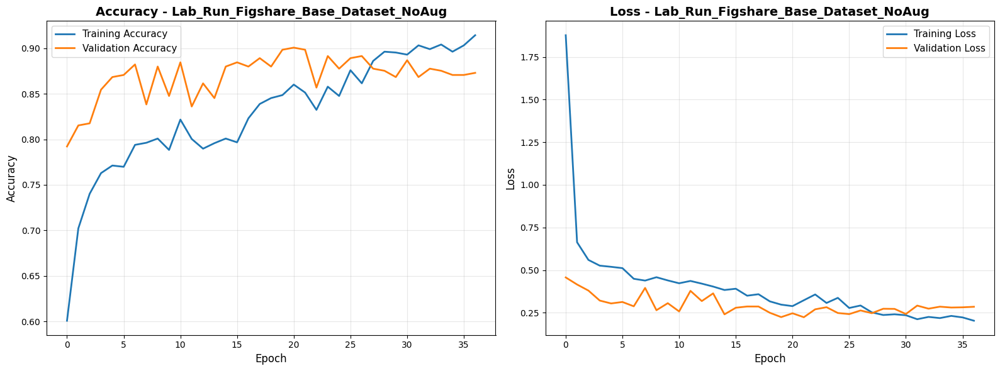

 Training plots saved

 LOADING BEST MODEL FOR EVALUATION



--- Evaluating on Test Set ---
15/15 ━━━━━━━━━━━━━━━━━━━━ 14s 914ms/step

 CLASSIFICATION REPORT

              precision    recall  f1-score   support

      glioma       0.91      0.83      0.87       201
  meningioma       0.74      0.82      0.78       119
   pituitary       0.96      0.99      0.97       152

    accuracy                           0.88       472
   macro avg       0.87      0.88      0.87       472
weighted avg       0.88      0.88      0.88       472

 Per-class metrics saved to CSV

 GENERATING CONFUSION MATRIX



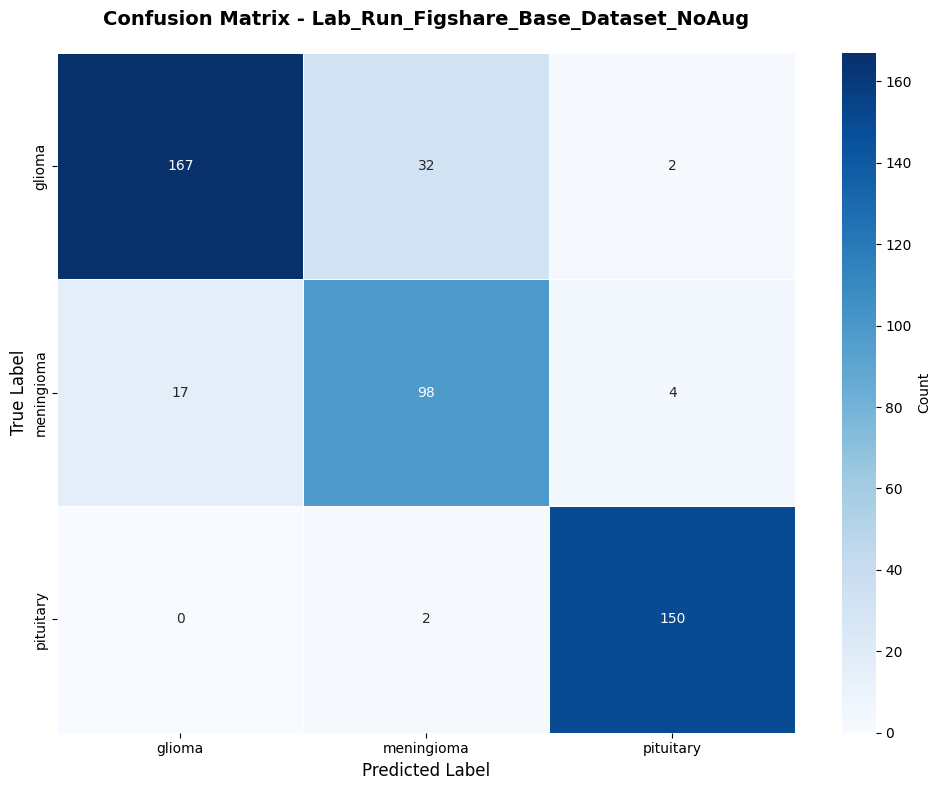

 Confusion matrix saved

 GENERATING ROC-AUC CURVES



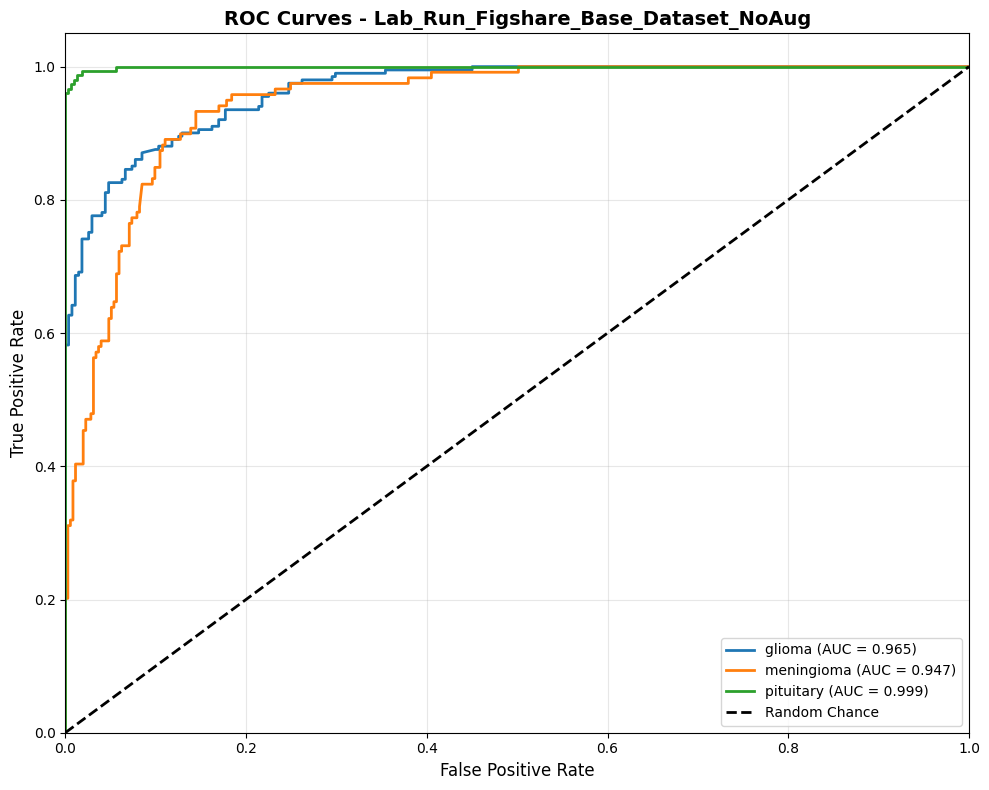

 ROC curves saved
   Mean AUC: 0.9703

 GENERATING GRAD-CAM VISUALIZATIONS

Using layer: block5_conv3

Generating 6-sample Grad-CAM grid...


/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['input_layer']]
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


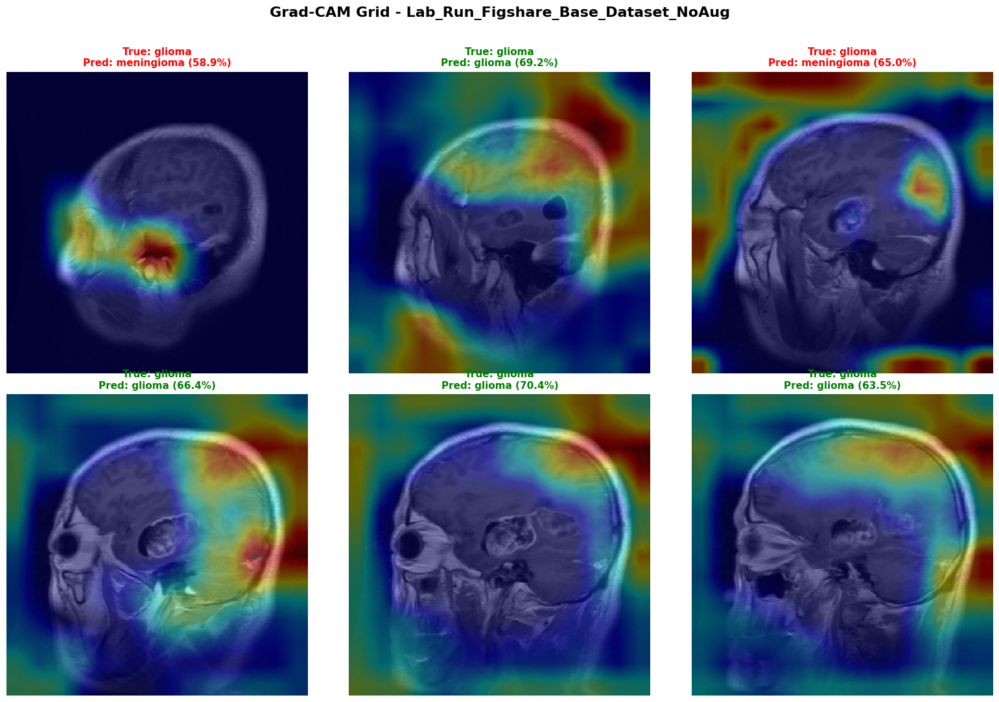

 Grad-CAM grid saved

Generating per-class Grad-CAM...


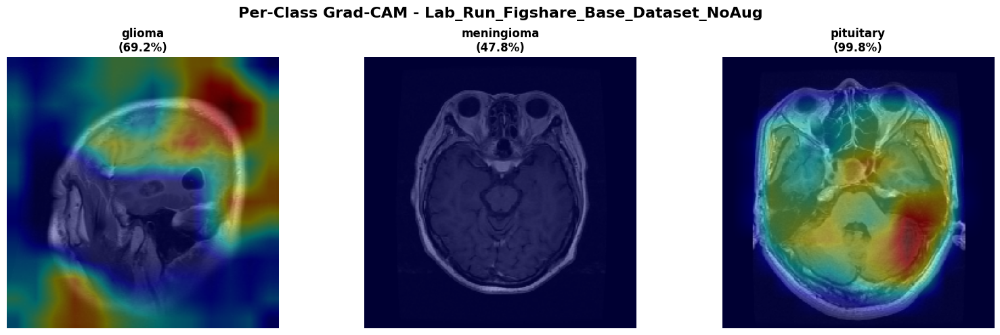

 Per-class Grad-CAM saved

 EXPERIMENT COMPLETE: Lab_Run_Figshare_Base_Dataset_NoAug
 All results saved to: Lab_Run_Figshare_Base_Dataset_NoAug/
 Total time: 0h 8m 47s
 Test Accuracy: 0.8792
 Mean AUC: 0.9703
 Overfitting Gap: 4.13%




In [ ]:
# RUN EXPERIMENT 1 (Baseline)
run_experiment(data_dir='Figshare_Base_Dataset', use_augmentation=False)


 STARTING EXPERIMENT: Lab_Run_Figshare_Base_Dataset_WithAug

 Data Augmentation: ENABLED
Found 2159 images belonging to 3 classes.
Found 433 images belonging to 3 classes.
Found 472 images belonging to 3 classes.
 Classes: ['glioma', 'meningioma', 'pituitary'] (Total: 3)
 Training samples: 2159
 Validation samples: 433
 Test samples: 472

 STAGE 1: Training with frozen VGG16 base



/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step - accuracy: 0.4220 - loss: 3.2851
Epoch 1: val_loss improved from inf to 0.77410, saving model to Lab_Run_Figshare_Base_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 41s 544ms/step - accuracy: 0.4228 - loss: 3.2665 - val_accuracy: 0.7506 - val_loss: 0.7741 - learning_rate: 0.0010
Epoch 2/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step - accuracy: 0.5739 - loss: 0.9088
Epoch 2: val_loss improved from 0.77410 to 0.60282, saving model to Lab_Run_Figshare_Base_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 32s 474ms/step - accuracy: 0.5742 - loss: 0.9084 - val_accuracy: 0.8083 - val_loss: 0.6028 - learning_rate: 0.0010
Epoch 3/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step - accuracy: 0.5963 - loss: 0.8351
Epoch 3: val_loss did not improve from 0.60282
68/68 ━━━━━━━━━━━━━━━━━━━━ 32s 475ms/step - accuracy: 0.5963 - loss: 0.8350 - val_accuracy: 0.7390 - val_loss: 0.6063 - learning_rate: 0.0010
Epoch 4/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step - accuracy: 0.6062 - loss: 0.8041
Epoch 4: val_loss did not improve from 0.60282
68/68 ━━━━━━━━━━━━━━━━━━━━ 32s 463ms/step - accuracy: 0.6061 - loss: 0.8045 - val_accuracy: 0.7483 - val_loss: 0.6324 - learning_rate: 0.0010
Epoch 5/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step - accuracy: 0.5991 - loss: 0.8273
Epoch 5: val_loss improved from 0.60282 to 0.55172, saving model to Lab_Run_Figshare_Base_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 32s 468ms/step - accuracy: 0.5993 - loss: 0.8271 - val_accuracy: 0.7552 - val_loss: 0.5517 - learning_rate: 0.0010
Epoch 6/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step - accuracy: 0.6082 - loss: 0.8007
Epoch 6: val_loss did not improve from 0.55172
68/68 ━━━━━━━━━━━━━━━━━━━━ 32s 469ms/step - accuracy: 0.6082 - loss: 0.8008 - val_accuracy: 0.7921 - val_loss: 0.5748 - learning_rate: 0.0010
Epoch 7/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step - accuracy: 0.5836 - loss: 0.8236
Epoch 7: val_loss did not improve from 0.55172
68/68 ━━━━━━━━━━━━━━━━━━━━ 32s 466ms/step - accuracy: 0.5835 - loss: 0.8238 - val_accuracy: 0.7898 - val_loss: 0.6061 - learning_rate: 0.0010
Epoch 8/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step - accuracy: 0.5486 - loss: 0.8446
Epoch 8: val_loss did not improve from 0.55172
68/68 ━━━━━━━━━━━━━━━━━━━━ 32s 461ms/step - accuracy: 0.5487 - loss: 0.8443 - val_accuracy: 0.7898 - val_loss: 0.5709 - learning_rate: 0.0010
Epoch 9/40
68/68 ━━━━━━━━━━━━━━━━

68/68 ━━━━━━━━━━━━━━━━━━━━ 32s 477ms/step - accuracy: 0.5697 - loss: 0.7865 - val_accuracy: 0.7760 - val_loss: 0.5229 - learning_rate: 0.0010
Epoch 10/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step - accuracy: 0.5687 - loss: 0.8095
Epoch 10: val_loss improved from 0.52285 to 0.51651, saving model to Lab_Run_Figshare_Base_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 32s 463ms/step - accuracy: 0.5687 - loss: 0.8098 - val_accuracy: 0.7806 - val_loss: 0.5165 - learning_rate: 0.0010
Epoch 11/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step - accuracy: 0.5615 - loss: 0.7911
Epoch 11: val_loss did not improve from 0.51651
68/68 ━━━━━━━━━━━━━━━━━━━━ 32s 466ms/step - accuracy: 0.5617 - loss: 0.7907 - val_accuracy: 0.8291 - val_loss: 0.6024 - learning_rate: 0.0010
Epoch 12/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step - accuracy: 0.5611 - loss: 0.8033
Epoch 12: val_loss did not improve from 0.51651
68/68 ━━━━━━━━━━━━━━━━━━━━ 32s 468ms/step - accuracy: 0.5612 - loss: 0.8032 - val_accuracy: 0.7159 - val_loss: 0.5559 - learning_rate: 0.0010
Epoch 13/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step - accuracy: 0.5982 - loss: 0.7630
Epoch 13: val_loss did not improve from 0.51651
68/68 ━━━━━━━━━━━━━━━━━━━━ 41s 468ms/step - accuracy: 0.5980 - loss: 0.7630 - val_accuracy: 0.7044 - val_loss: 0.5494 - learning_rate: 0.0010
Epoch 14/40
68/68 ━━━━━━━━━

68/68 ━━━━━━━━━━━━━━━━━━━━ 32s 472ms/step - accuracy: 0.6020 - loss: 0.7495 - val_accuracy: 0.7945 - val_loss: 0.4976 - learning_rate: 0.0010
Epoch 15/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step - accuracy: 0.5930 - loss: 0.7658
Epoch 15: val_loss did not improve from 0.49757
68/68 ━━━━━━━━━━━━━━━━━━━━ 31s 456ms/step - accuracy: 0.5927 - loss: 0.7661 - val_accuracy: 0.8106 - val_loss: 0.5486 - learning_rate: 0.0010
Epoch 16/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step - accuracy: 0.5712 - loss: 0.7604
Epoch 16: val_loss improved from 0.49757 to 0.46831, saving model to Lab_Run_Figshare_Base_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 33s 480ms/step - accuracy: 0.5714 - loss: 0.7605 - val_accuracy: 0.8083 - val_loss: 0.4683 - learning_rate: 0.0010
Epoch 17/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step - accuracy: 0.5901 - loss: 0.7890
Epoch 17: val_loss did not improve from 0.46831
68/68 ━━━━━━━━━━━━━━━━━━━━ 31s 460ms/step - accuracy: 0.5896 - loss: 0.7891 - val_accuracy: 0.8383 - val_loss: 0.5972 - learning_rate: 0.0010
Epoch 18/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step - accuracy: 0.5409 - loss: 0.8157
Epoch 18: val_loss did not improve from 0.46831
68/68 ━━━━━━━━━━━━━━━━━━━━ 32s 462ms/step - accuracy: 0.5409 - loss: 0.8154 - val_accuracy: 0.8637 - val_loss: 0.5375 - learning_rate: 0.0010
Epoch 19/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step - accuracy: 0.5444 - loss: 0.7886
Epoch 19: val_loss did not improve from 0.46831
68/68 ━━━━━━━━━━━━━━━━━━━━ 32s 469ms/step - accuracy: 0.5444 - loss: 0.7889 - val_accuracy: 0.7691 - val_loss: 0.6206 - learning_rate: 0.0010
Epoch 20/40
68/68 ━━━━━━━━━

68/68 ━━━━━━━━━━━━━━━━━━━━ 33s 485ms/step - accuracy: 0.5534 - loss: 0.7597 - val_accuracy: 0.7898 - val_loss: 0.4654 - learning_rate: 2.0000e-04
Epoch 27/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step - accuracy: 0.5968 - loss: 0.7208
Epoch 27: val_loss improved from 0.46544 to 0.46504, saving model to Lab_Run_Figshare_Base_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 34s 493ms/step - accuracy: 0.5966 - loss: 0.7211 - val_accuracy: 0.7875 - val_loss: 0.4650 - learning_rate: 2.0000e-04
Epoch 28/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step - accuracy: 0.5711 - loss: 0.7276
Epoch 28: val_loss did not improve from 0.46504
68/68 ━━━━━━━━━━━━━━━━━━━━ 33s 480ms/step - accuracy: 0.5712 - loss: 0.7275 - val_accuracy: 0.8522 - val_loss: 0.4770 - learning_rate: 2.0000e-04
Epoch 29/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step - accuracy: 0.5744 - loss: 0.7192
Epoch 29: val_loss improved from 0.46504 to 0.45954, saving model to Lab_Run_Figshare_Base_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 33s 481ms/step - accuracy: 0.5746 - loss: 0.7191 - val_accuracy: 0.8453 - val_loss: 0.4595 - learning_rate: 2.0000e-04
Epoch 30/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step - accuracy: 0.5915 - loss: 0.7511
Epoch 30: val_loss did not improve from 0.45954
68/68 ━━━━━━━━━━━━━━━━━━━━ 33s 493ms/step - accuracy: 0.5916 - loss: 0.7510 - val_accuracy: 0.8476 - val_loss: 0.4847 - learning_rate: 2.0000e-04
Epoch 31/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step - accuracy: 0.5870 - loss: 0.7103
Epoch 31: val_loss did not improve from 0.45954
68/68 ━━━━━━━━━━━━━━━━━━━━ 32s 472ms/step - accuracy: 0.5872 - loss: 0.7103 - val_accuracy: 0.8522 - val_loss: 0.4792 - learning_rate: 2.0000e-04
Epoch 32/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step - accuracy: 0.6011 - loss: 0.7097
Epoch 32: val_loss did not improve from 0.45954
68/68 ━━━━━━━━━━━━━━━━━━━━ 33s 476ms/step - accuracy: 0.6011 - loss: 0.7099 - val_accuracy: 0.8684 - val_loss: 0.5001 - learning_rate: 2.0000e-04
Epoch 33/40

68/68 ━━━━━━━━━━━━━━━━━━━━ 60s 689ms/step - accuracy: 0.6378 - loss: 0.7576 - val_accuracy: 0.7667 - val_loss: 0.4493 - learning_rate: 1.0000e-05
Epoch 42/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step - accuracy: 0.5970 - loss: 0.7336
Epoch 42: val_loss did not improve from 0.44931
68/68 ━━━━━━━━━━━━━━━━━━━━ 35s 509ms/step - accuracy: 0.5974 - loss: 0.7333 - val_accuracy: 0.7829 - val_loss: 0.4687 - learning_rate: 1.0000e-05
Epoch 43/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step - accuracy: 0.6242 - loss: 0.7177
Epoch 43: val_loss improved from 0.44931 to 0.40412, saving model to Lab_Run_Figshare_Base_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 35s 514ms/step - accuracy: 0.6242 - loss: 0.7175 - val_accuracy: 0.7852 - val_loss: 0.4041 - learning_rate: 1.0000e-05
Epoch 44/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step - accuracy: 0.6306 - loss: 0.6873
Epoch 44: val_loss did not improve from 0.40412
68/68 ━━━━━━━━━━━━━━━━━━━━ 34s 505ms/step - accuracy: 0.6305 - loss: 0.6874 - val_accuracy: 0.7413 - val_loss: 0.4491 - learning_rate: 1.0000e-05
Epoch 45/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step - accuracy: 0.6235 - loss: 0.6624
Epoch 45: val_loss did not improve from 0.40412
68/68 ━━━━━━━━━━━━━━━━━━━━ 34s 494ms/step - accuracy: 0.6233 - loss: 0.6625 - val_accuracy: 0.7621 - val_loss: 0.4045 - learning_rate: 1.0000e-05
Epoch 46/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step - accuracy: 0.6291 - loss: 0.6728
Epoch 46: val_loss did not improve from 0.40412
68/68 ━━━━━━━━━━━━━━━━━━━━ 35s 508ms/step - accuracy: 0.6292 - loss: 0.6727 - val_accuracy: 0.7829 - val_loss: 0.4223 - learning_rate: 1.0000e-05
Epoch 47

68/68 ━━━━━━━━━━━━━━━━━━━━ 37s 549ms/step - accuracy: 0.6522 - loss: 0.6584 - val_accuracy: 0.8868 - val_loss: 0.3522 - learning_rate: 1.0000e-05
Epoch 49/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step - accuracy: 0.7301 - loss: 0.5915
Epoch 49: val_loss improved from 0.35218 to 0.30002, saving model to Lab_Run_Figshare_Base_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 36s 524ms/step - accuracy: 0.7299 - loss: 0.5917 - val_accuracy: 0.8822 - val_loss: 0.3000 - learning_rate: 1.0000e-05
Epoch 50/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step - accuracy: 0.7694 - loss: 0.5145
Epoch 50: val_loss improved from 0.30002 to 0.29896, saving model to Lab_Run_Figshare_Base_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 38s 546ms/step - accuracy: 0.7694 - loss: 0.5145 - val_accuracy: 0.8753 - val_loss: 0.2990 - learning_rate: 1.0000e-05
Epoch 51/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step - accuracy: 0.7727 - loss: 0.4939
Epoch 51: val_loss improved from 0.29896 to 0.27750, saving model to Lab_Run_Figshare_Base_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 37s 539ms/step - accuracy: 0.7727 - loss: 0.4942 - val_accuracy: 0.8845 - val_loss: 0.2775 - learning_rate: 1.0000e-05
Epoch 52/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step - accuracy: 0.8010 - loss: 0.4766
Epoch 52: val_loss improved from 0.27750 to 0.25665, saving model to Lab_Run_Figshare_Base_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 37s 536ms/step - accuracy: 0.8010 - loss: 0.4764 - val_accuracy: 0.8915 - val_loss: 0.2567 - learning_rate: 1.0000e-05
Epoch 53/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step - accuracy: 0.8278 - loss: 0.4046
Epoch 53: val_loss improved from 0.25665 to 0.21853, saving model to Lab_Run_Figshare_Base_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 37s 544ms/step - accuracy: 0.8279 - loss: 0.4045 - val_accuracy: 0.9122 - val_loss: 0.2185 - learning_rate: 1.0000e-05
Epoch 54/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step - accuracy: 0.8493 - loss: 0.3861
Epoch 54: val_loss improved from 0.21853 to 0.18026, saving model to Lab_Run_Figshare_Base_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 35s 513ms/step - accuracy: 0.8493 - loss: 0.3861 - val_accuracy: 0.9238 - val_loss: 0.1803 - learning_rate: 1.0000e-05
Epoch 55/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step - accuracy: 0.8611 - loss: 0.3347
Epoch 55: val_loss did not improve from 0.18026
68/68 ━━━━━━━━━━━━━━━━━━━━ 34s 497ms/step - accuracy: 0.8612 - loss: 0.3347 - val_accuracy: 0.9145 - val_loss: 0.1865 - learning_rate: 1.0000e-05
Epoch 56/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step - accuracy: 0.8686 - loss: 0.3068
Epoch 56: val_loss improved from 0.18026 to 0.17407, saving model to Lab_Run_Figshare_Base_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 36s 523ms/step - accuracy: 0.8687 - loss: 0.3068 - val_accuracy: 0.9122 - val_loss: 0.1741 - learning_rate: 1.0000e-05
Epoch 57/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step - accuracy: 0.8788 - loss: 0.3096
Epoch 57: val_loss did not improve from 0.17407
68/68 ━━━━━━━━━━━━━━━━━━━━ 35s 510ms/step - accuracy: 0.8789 - loss: 0.3092 - val_accuracy: 0.9376 - val_loss: 0.1765 - learning_rate: 1.0000e-05
Epoch 58/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step - accuracy: 0.8962 - loss: 0.2766
Epoch 58: val_loss improved from 0.17407 to 0.17317, saving model to Lab_Run_Figshare_Base_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 36s 525ms/step - accuracy: 0.8961 - loss: 0.2767 - val_accuracy: 0.9284 - val_loss: 0.1732 - learning_rate: 1.0000e-05
Epoch 59/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step - accuracy: 0.8919 - loss: 0.2885
Epoch 59: val_loss did not improve from 0.17317
68/68 ━━━━━━━━━━━━━━━━━━━━ 35s 506ms/step - accuracy: 0.8920 - loss: 0.2882 - val_accuracy: 0.9169 - val_loss: 0.1829 - learning_rate: 1.0000e-05
Epoch 60/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step - accuracy: 0.9098 - loss: 0.2373
Epoch 60: val_loss improved from 0.17317 to 0.16971, saving model to Lab_Run_Figshare_Base_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 35s 515ms/step - accuracy: 0.9100 - loss: 0.2372 - val_accuracy: 0.9400 - val_loss: 0.1697 - learning_rate: 1.0000e-05
Epoch 61/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step - accuracy: 0.9257 - loss: 0.2197
Epoch 61: val_loss did not improve from 0.16971
68/68 ━━━━━━━━━━━━━━━━━━━━ 34s 496ms/step - accuracy: 0.9256 - loss: 0.2197 - val_accuracy: 0.8776 - val_loss: 0.2569 - learning_rate: 1.0000e-05
Epoch 62/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step - accuracy: 0.9258 - loss: 0.2095
Epoch 62: val_loss did not improve from 0.16971
68/68 ━━━━━━━━━━━━━━━━━━━━ 34s 499ms/step - accuracy: 0.9258 - loss: 0.2094 - val_accuracy: 0.8938 - val_loss: 0.2707 - learning_rate: 1.0000e-05
Epoch 63/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step - accuracy: 0.9359 - loss: 0.1720
Epoch 63: val_loss improved from 0.16971 to 0.16334, saving model to Lab_Run_Figshare_Base_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 36s 523ms/step - accuracy: 0.9360 - loss: 0.1719 - val_accuracy: 0.9400 - val_loss: 0.1633 - learning_rate: 1.0000e-05
Epoch 64/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step - accuracy: 0.9495 - loss: 0.1313
Epoch 64: val_loss did not improve from 0.16334
68/68 ━━━━━━━━━━━━━━━━━━━━ 35s 508ms/step - accuracy: 0.9495 - loss: 0.1314 - val_accuracy: 0.9215 - val_loss: 0.1981 - learning_rate: 1.0000e-05
Epoch 65/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step - accuracy: 0.9497 - loss: 0.1493
Epoch 65: val_loss did not improve from 0.16334
68/68 ━━━━━━━━━━━━━━━━━━━━ 35s 508ms/step - accuracy: 0.9497 - loss: 0.1491 - val_accuracy: 0.9400 - val_loss: 0.1738 - learning_rate: 1.0000e-05
Epoch 66/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step - accuracy: 0.9551 - loss: 0.1411
Epoch 66: val_loss improved from 0.16334 to 0.15830, saving model to Lab_Run_Figshare_Base_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 36s 521ms/step - accuracy: 0.9551 - loss: 0.1409 - val_accuracy: 0.9423 - val_loss: 0.1583 - learning_rate: 1.0000e-05
Epoch 67/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step - accuracy: 0.9582 - loss: 0.1183
Epoch 67: val_loss did not improve from 0.15830
68/68 ━━━━━━━━━━━━━━━━━━━━ 34s 497ms/step - accuracy: 0.9581 - loss: 0.1186 - val_accuracy: 0.9030 - val_loss: 0.2242 - learning_rate: 1.0000e-05
Epoch 68/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step - accuracy: 0.9570 - loss: 0.1292
Epoch 68: val_loss did not improve from 0.15830
68/68 ━━━━━━━━━━━━━━━━━━━━ 34s 496ms/step - accuracy: 0.9570 - loss: 0.1292 - val_accuracy: 0.9261 - val_loss: 0.1719 - learning_rate: 1.0000e-05
Epoch 69/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step - accuracy: 0.9589 - loss: 0.1120
Epoch 69: val_loss did not improve from 0.15830
68/68 ━━━━━━━━━━━━━━━━━━━━ 42s 509ms/step - accuracy: 0.9589 - loss: 0.1119 - val_accuracy: 0.8961 - val_loss: 0.3281 - learning_rate: 1.0000e-05
Epoch 70

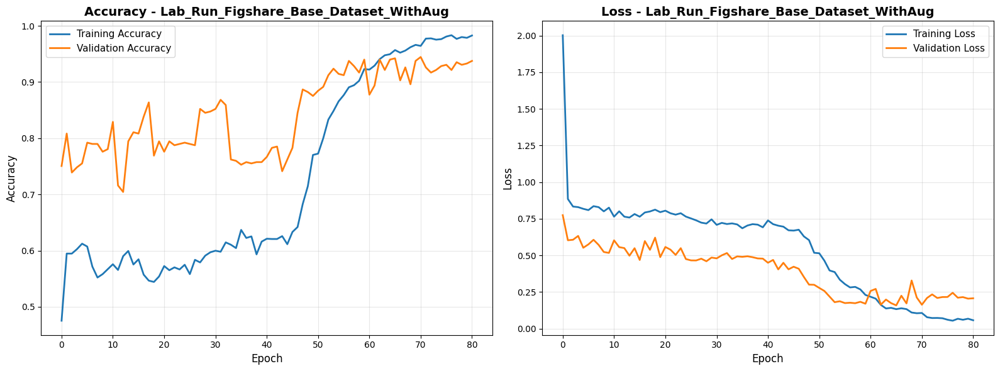

 Training plots saved

 LOADING BEST MODEL FOR EVALUATION



--- Evaluating on Test Set ---
15/15 ━━━━━━━━━━━━━━━━━━━━ 4s 198ms/step

 CLASSIFICATION REPORT

              precision    recall  f1-score   support

      glioma       0.96      0.92      0.94       201
  meningioma       0.86      0.83      0.85       119
   pituitary       0.92      1.00      0.96       152

    accuracy                           0.92       472
   macro avg       0.91      0.92      0.91       472
weighted avg       0.92      0.92      0.92       472

 Per-class metrics saved to CSV

 GENERATING CONFUSION MATRIX



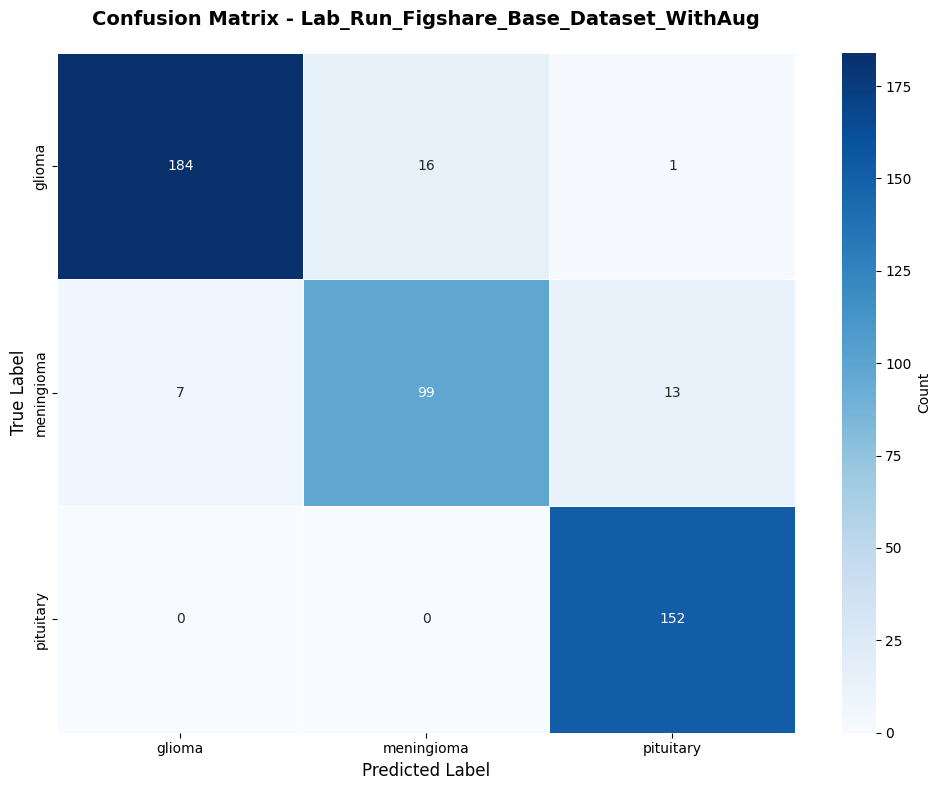

 Confusion matrix saved

 GENERATING ROC-AUC CURVES



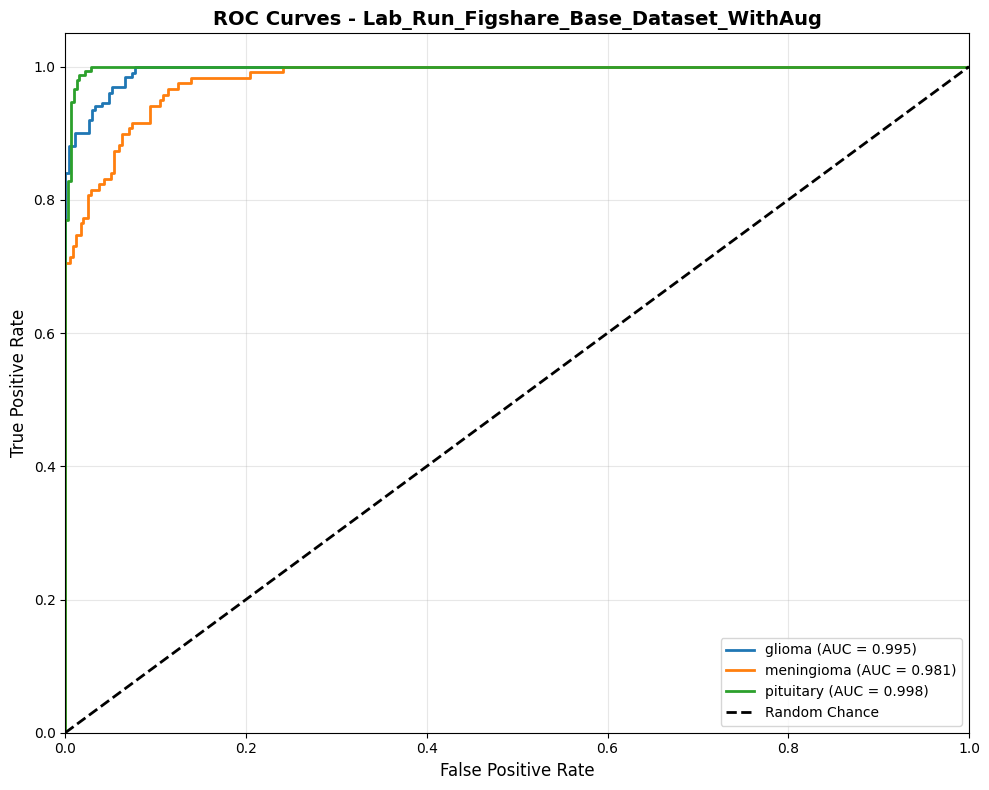

 ROC curves saved
   Mean AUC: 0.9915

 GENERATING GRAD-CAM VISUALIZATIONS

Using layer: block5_conv3

Generating 6-sample Grad-CAM grid...


/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['input_layer_1']]
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


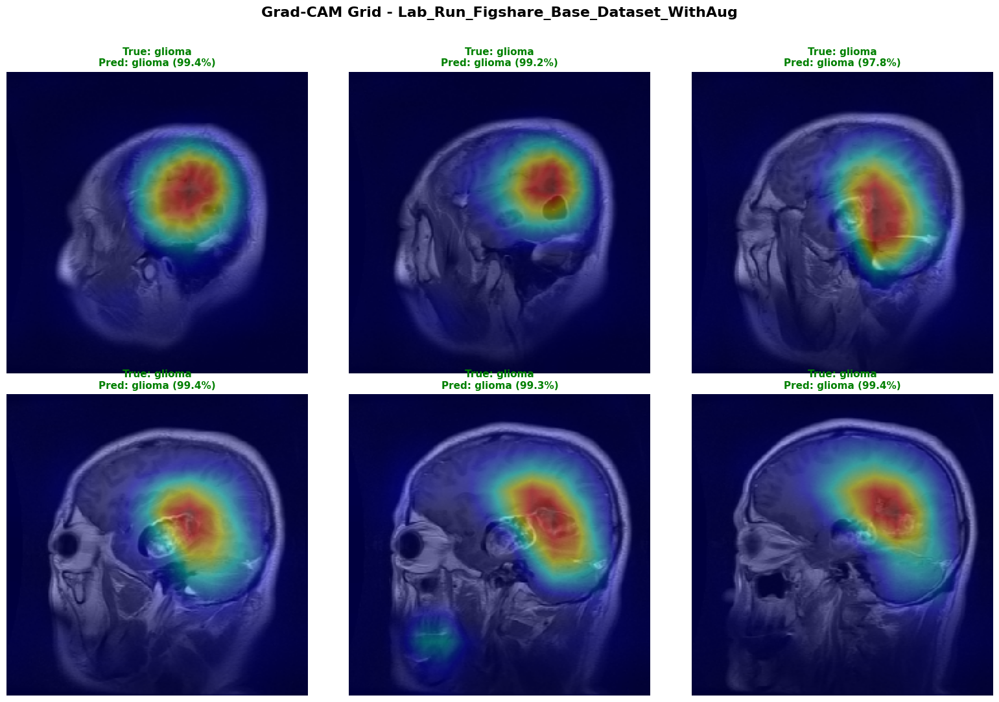

 Grad-CAM grid saved

Generating per-class Grad-CAM...


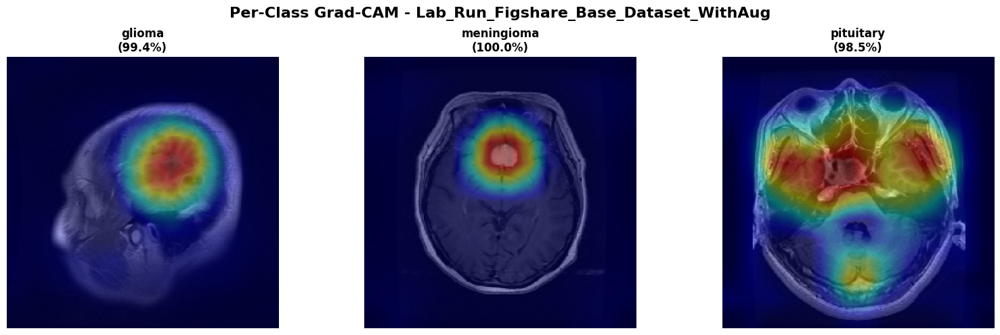

 Per-class Grad-CAM saved

 EXPERIMENT COMPLETE: Lab_Run_Figshare_Base_Dataset_WithAug
 All results saved to: Lab_Run_Figshare_Base_Dataset_WithAug/
 Total time: 0h 46m 55s
 Test Accuracy: 0.9216
 Mean AUC: 0.9915
 Overfitting Gap: 4.52%




In [ ]:
# RUN EXPERIMENT 2 (Augmentation Only)
run_experiment(data_dir='Figshare_Base_Dataset', use_augmentation=True)


 STARTING EXPERIMENT: Lab_Run_CLAHE_Dataset_NoAug

 Data Augmentation: DISABLED
Found 2159 images belonging to 3 classes.
Found 433 images belonging to 3 classes.
Found 472 images belonging to 3 classes.
 Classes: ['glioma', 'meningioma', 'pituitary'] (Total: 3)
 Training samples: 2159
 Validation samples: 433
 Test samples: 472

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step
 STAGE 1: Training with frozen VGG16 base



/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.5355 - loss: 2.7966
Epoch 1: val_loss improved from inf to 0.39551, saving model to Lab_Run_CLAHE_Dataset_NoAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 56s 598ms/step - accuracy: 0.5368 - loss: 2.7828 - val_accuracy: 0.8499 - val_loss: 0.3955 - learning_rate: 0.0010
Epoch 2/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - accuracy: 0.7716 - loss: 0.5372
Epoch 2: val_loss improved from 0.39551 to 0.36644, saving model to Lab_Run_CLAHE_Dataset_NoAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 41s 203ms/step - accuracy: 0.7716 - loss: 0.5375 - val_accuracy: 0.8268 - val_loss: 0.3664 - learning_rate: 0.0010
Epoch 3/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - accuracy: 0.7680 - loss: 0.5126
Epoch 3: val_loss improved from 0.36644 to 0.36361, saving model to Lab_Run_CLAHE_Dataset_NoAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 14s 203ms/step - accuracy: 0.7683 - loss: 0.5123 - val_accuracy: 0.8268 - val_loss: 0.3636 - learning_rate: 0.0010
Epoch 4/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.8106 - loss: 0.4879
Epoch 4: val_loss improved from 0.36361 to 0.28166, saving model to Lab_Run_CLAHE_Dataset_NoAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 14s 206ms/step - accuracy: 0.8107 - loss: 0.4875 - val_accuracy: 0.8661 - val_loss: 0.2817 - learning_rate: 0.0010
Epoch 5/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step - accuracy: 0.8232 - loss: 0.4125
Epoch 5: val_loss did not improve from 0.28166
68/68 ━━━━━━━━━━━━━━━━━━━━ 14s 205ms/step - accuracy: 0.8232 - loss: 0.4124 - val_accuracy: 0.8707 - val_loss: 0.2861 - learning_rate: 0.0010
Epoch 6/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step - accuracy: 0.8273 - loss: 0.3954
Epoch 6: val_loss improved from 0.28166 to 0.28088, saving model to Lab_Run_CLAHE_Dataset_NoAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 15s 220ms/step - accuracy: 0.8274 - loss: 0.3952 - val_accuracy: 0.8707 - val_loss: 0.2809 - learning_rate: 0.0010
Epoch 7/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step - accuracy: 0.8588 - loss: 0.3647
Epoch 7: val_loss did not improve from 0.28088
68/68 ━━━━━━━━━━━━━━━━━━━━ 14s 207ms/step - accuracy: 0.8588 - loss: 0.3645 - val_accuracy: 0.8522 - val_loss: 0.3166 - learning_rate: 0.0010
Epoch 8/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - accuracy: 0.8590 - loss: 0.3634
Epoch 8: val_loss did not improve from 0.28088
68/68 ━━━━━━━━━━━━━━━━━━━━ 14s 201ms/step - accuracy: 0.8590 - loss: 0.3634 - val_accuracy: 0.8661 - val_loss: 0.3087 - learning_rate: 0.0010
Epoch 9/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - accuracy: 0.8717 - loss: 0.3282
Epoch 9: val_loss did not improve from 0.28088
68/68 ━━━━━━━━━━━━━━━━━━━━ 14s 201ms/step - accuracy: 0.8716 - loss: 0.3284 - val_accuracy: 0.8614 - val_loss: 0.2819 - learning_rate: 0.0010
Epoch 10/40
68/68 ━━━━━━━━━━━━━━━

68/68 ━━━━━━━━━━━━━━━━━━━━ 15s 213ms/step - accuracy: 0.9263 - loss: 0.2181 - val_accuracy: 0.8822 - val_loss: 0.2801 - learning_rate: 2.0000e-04
Epoch 15/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step - accuracy: 0.9296 - loss: 0.2036
Epoch 15: val_loss did not improve from 0.28011
68/68 ━━━━━━━━━━━━━━━━━━━━ 14s 206ms/step - accuracy: 0.9296 - loss: 0.2036 - val_accuracy: 0.8730 - val_loss: 0.2949 - learning_rate: 2.0000e-04
Epoch 16/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step - accuracy: 0.9250 - loss: 0.1983
Epoch 16: val_loss did not improve from 0.28011
68/68 ━━━━━━━━━━━━━━━━━━━━ 14s 204ms/step - accuracy: 0.9251 - loss: 0.1982 - val_accuracy: 0.8845 - val_loss: 0.3126 - learning_rate: 2.0000e-04
Epoch 17/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step - accuracy: 0.9297 - loss: 0.2047
Epoch 17: val_loss did not improve from 0.28011
68/68 ━━━━━━━━━━━━━━━━━━━━ 14s 204ms/step - accuracy: 0.9298 - loss: 0.2046 - val_accuracy: 0.8776 - val_loss: 0.2916 - learning_rate: 2.0000e-04
Epoch 18/40

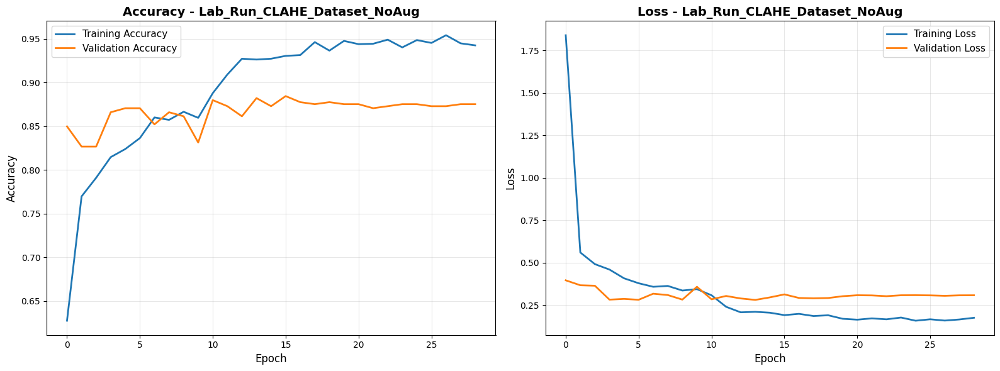

 Training plots saved

 LOADING BEST MODEL FOR EVALUATION



--- Evaluating on Test Set ---
15/15 ━━━━━━━━━━━━━━━━━━━━ 14s 904ms/step

 CLASSIFICATION REPORT

              precision    recall  f1-score   support

      glioma       0.85      0.93      0.89       201
  meningioma       0.84      0.71      0.77       119
   pituitary       0.98      0.97      0.98       152

    accuracy                           0.89       472
   macro avg       0.89      0.87      0.88       472
weighted avg       0.89      0.89      0.89       472

 Per-class metrics saved to CSV

 GENERATING CONFUSION MATRIX



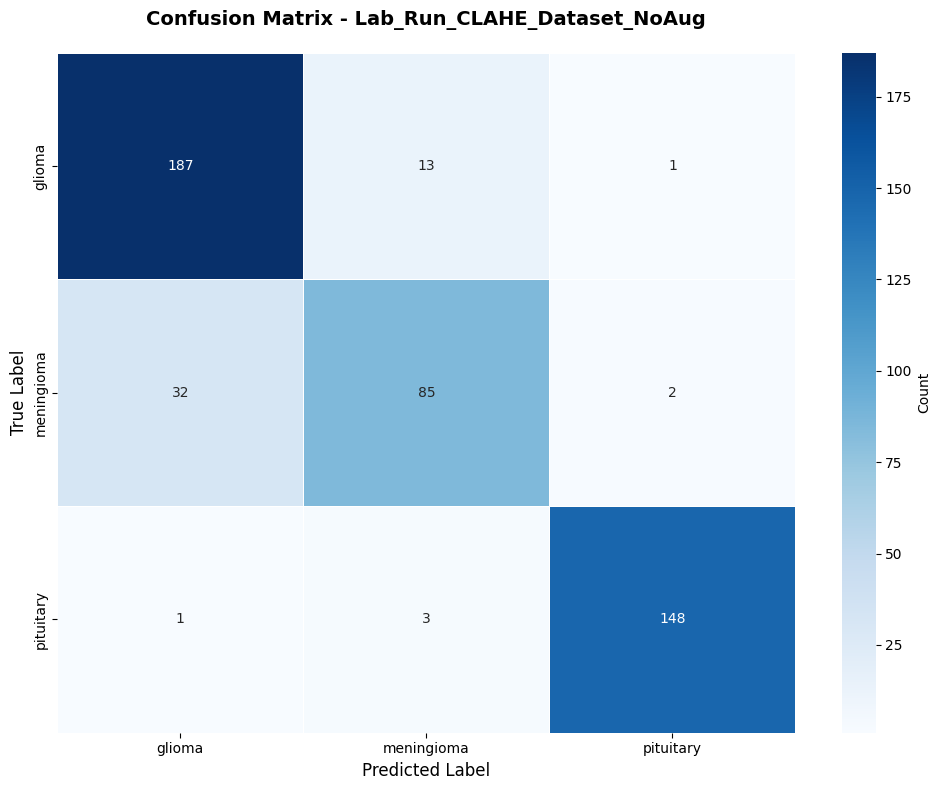

 Confusion matrix saved

 GENERATING ROC-AUC CURVES



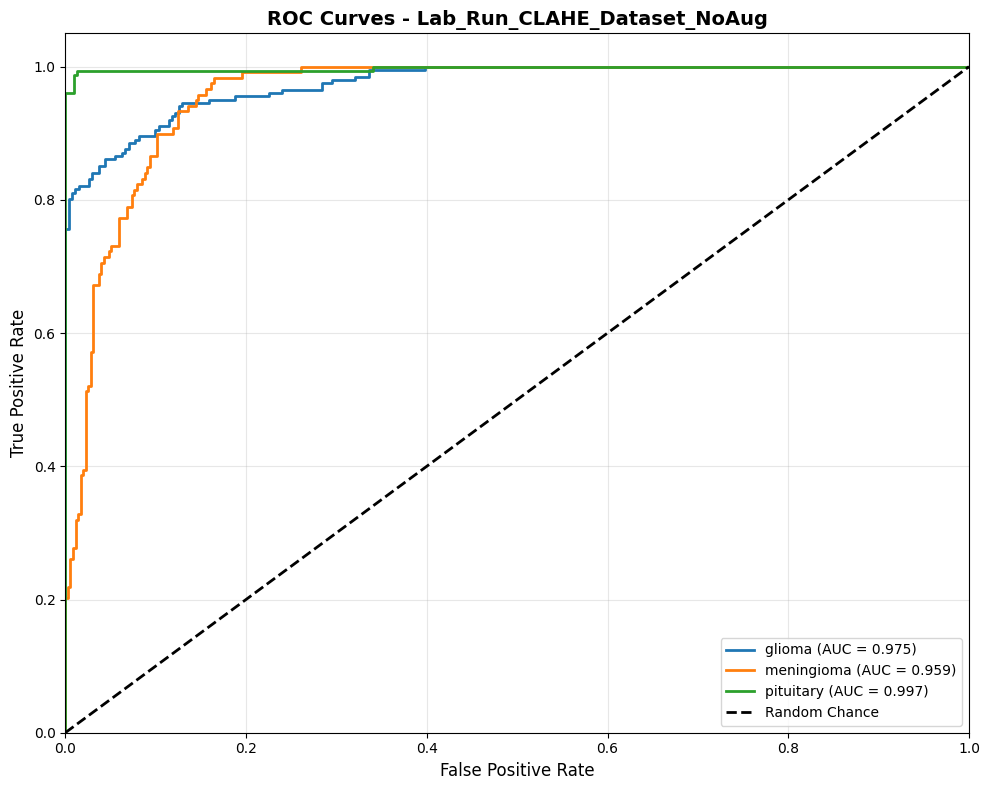

 ROC curves saved
   Mean AUC: 0.9771

 GENERATING GRAD-CAM VISUALIZATIONS

Using layer: block5_conv3

Generating 6-sample Grad-CAM grid...


/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['input_layer']]
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


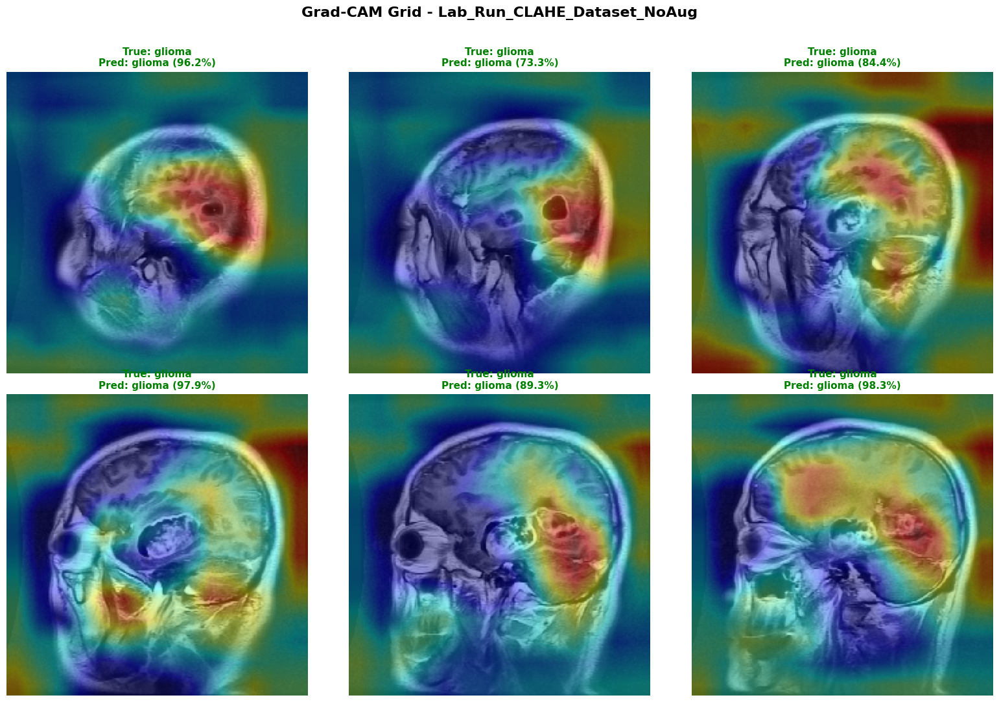

 Grad-CAM grid saved

Generating per-class Grad-CAM...


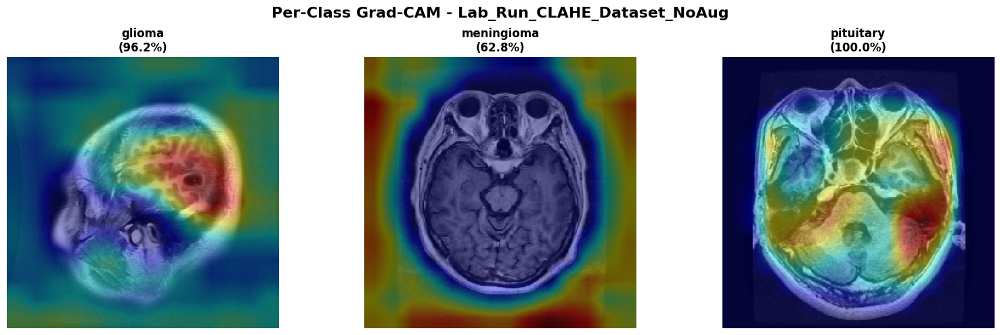

 Per-class Grad-CAM saved

 EXPERIMENT COMPLETE: Lab_Run_CLAHE_Dataset_NoAug
 All results saved to: Lab_Run_CLAHE_Dataset_NoAug/
 Total time: 0h 8m 1s
 Test Accuracy: 0.8898
 Mean AUC: 0.9771
 Overfitting Gap: 6.73%




In [ ]:
# RUN EXPERIMENT 3 CLAHE
run_experiment(data_dir='CLAHE_Dataset', use_augmentation=False)


 STARTING EXPERIMENT: Lab_Run_Skull_Stripped_Dataset_NoAug

 Data Augmentation: DISABLED
Found 2159 images belonging to 3 classes.
Found 433 images belonging to 3 classes.
Found 472 images belonging to 3 classes.
 Classes: ['glioma', 'meningioma', 'pituitary'] (Total: 3)
 Training samples: 2159
 Validation samples: 433
 Test samples: 472

 STAGE 1: Training with frozen VGG16 base



/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - accuracy: 0.4895 - loss: 2.8023
Epoch 1: val_loss improved from inf to 0.45951, saving model to Lab_Run_Skull_Stripped_Dataset_NoAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 26s 286ms/step - accuracy: 0.4907 - loss: 2.7864 - val_accuracy: 0.8245 - val_loss: 0.4595 - learning_rate: 0.0010
Epoch 2/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step - accuracy: 0.7112 - loss: 0.6573
Epoch 2: val_loss improved from 0.45951 to 0.42022, saving model to Lab_Run_Skull_Stripped_Dataset_NoAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 15s 220ms/step - accuracy: 0.7115 - loss: 0.6567 - val_accuracy: 0.7852 - val_loss: 0.4202 - learning_rate: 0.0010
Epoch 3/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.7506 - loss: 0.5763
Epoch 3: val_loss improved from 0.42022 to 0.33895, saving model to Lab_Run_Skull_Stripped_Dataset_NoAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 14s 208ms/step - accuracy: 0.7507 - loss: 0.5760 - val_accuracy: 0.8406 - val_loss: 0.3389 - learning_rate: 0.0010
Epoch 4/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.7795 - loss: 0.5295
Epoch 4: val_loss did not improve from 0.33895
68/68 ━━━━━━━━━━━━━━━━━━━━ 13s 197ms/step - accuracy: 0.7791 - loss: 0.5299 - val_accuracy: 0.7760 - val_loss: 0.4892 - learning_rate: 0.0010
Epoch 5/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step - accuracy: 0.7338 - loss: 0.5765
Epoch 5: val_loss improved from 0.33895 to 0.33500, saving model to Lab_Run_Skull_Stripped_Dataset_NoAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 14s 211ms/step - accuracy: 0.7336 - loss: 0.5767 - val_accuracy: 0.8591 - val_loss: 0.3350 - learning_rate: 0.0010
Epoch 6/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step - accuracy: 0.7425 - loss: 0.5537
Epoch 6: val_loss did not improve from 0.33500
68/68 ━━━━━━━━━━━━━━━━━━━━ 14s 202ms/step - accuracy: 0.7425 - loss: 0.5532 - val_accuracy: 0.8406 - val_loss: 0.4271 - learning_rate: 0.0010
Epoch 7/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step - accuracy: 0.7699 - loss: 0.4990
Epoch 7: val_loss improved from 0.33500 to 0.29216, saving model to Lab_Run_Skull_Stripped_Dataset_NoAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 15s 214ms/step - accuracy: 0.7698 - loss: 0.4988 - val_accuracy: 0.8984 - val_loss: 0.2922 - learning_rate: 0.0010
Epoch 8/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step - accuracy: 0.8127 - loss: 0.4342
Epoch 8: val_loss did not improve from 0.29216
68/68 ━━━━━━━━━━━━━━━━━━━━ 14s 204ms/step - accuracy: 0.8127 - loss: 0.4344 - val_accuracy: 0.8661 - val_loss: 0.3310 - learning_rate: 0.0010
Epoch 9/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step - accuracy: 0.7854 - loss: 0.5018
Epoch 9: val_loss did not improve from 0.29216
68/68 ━━━━━━━━━━━━━━━━━━━━ 14s 206ms/step - accuracy: 0.7853 - loss: 0.5017 - val_accuracy: 0.8753 - val_loss: 0.3035 - learning_rate: 0.0010
Epoch 10/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step - accuracy: 0.8300 - loss: 0.4007
Epoch 10: val_loss improved from 0.29216 to 0.27052, saving model to Lab_Run_Skull_Stripped_Dataset_NoAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 17s 252ms/step - accuracy: 0.8300 - loss: 0.4011 - val_accuracy: 0.8753 - val_loss: 0.2705 - learning_rate: 0.0010
Epoch 11/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step - accuracy: 0.8238 - loss: 0.4462
Epoch 11: val_loss did not improve from 0.27052
68/68 ━━━━━━━━━━━━━━━━━━━━ 17s 241ms/step - accuracy: 0.8239 - loss: 0.4462 - val_accuracy: 0.8406 - val_loss: 0.3342 - learning_rate: 0.0010
Epoch 12/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step - accuracy: 0.8238 - loss: 0.4168
Epoch 12: val_loss did not improve from 0.27052
68/68 ━━━━━━━━━━━━━━━━━━━━ 14s 203ms/step - accuracy: 0.8239 - loss: 0.4166 - val_accuracy: 0.8545 - val_loss: 0.3158 - learning_rate: 0.0010
Epoch 13/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step - accuracy: 0.8661 - loss: 0.3484
Epoch 13: val_loss improved from 0.27052 to 0.26367, saving model to Lab_Run_Skull_Stripped_Dataset_NoAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 14s 211ms/step - accuracy: 0.8660 - loss: 0.3486 - val_accuracy: 0.8868 - val_loss: 0.2637 - learning_rate: 0.0010
Epoch 14/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step - accuracy: 0.8669 - loss: 0.3359
Epoch 14: val_loss did not improve from 0.26367
68/68 ━━━━━━━━━━━━━━━━━━━━ 14s 203ms/step - accuracy: 0.8665 - loss: 0.3366 - val_accuracy: 0.8730 - val_loss: 0.3081 - learning_rate: 0.0010
Epoch 15/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step - accuracy: 0.8258 - loss: 0.4083
Epoch 15: val_loss did not improve from 0.26367
68/68 ━━━━━━━━━━━━━━━━━━━━ 14s 205ms/step - accuracy: 0.8257 - loss: 0.4084 - val_accuracy: 0.8661 - val_loss: 0.3193 - learning_rate: 0.0010
Epoch 16/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - accuracy: 0.7911 - loss: 0.4523
Epoch 16: val_loss did not improve from 0.26367
68/68 ━━━━━━━━━━━━━━━━━━━━ 14s 201ms/step - accuracy: 0.7914 - loss: 0.4518 - val_accuracy: 0.8661 - val_loss: 0.3002 - learning_rate: 0.0010
Epoch 17/40
68/68 ━━━━━━━━━

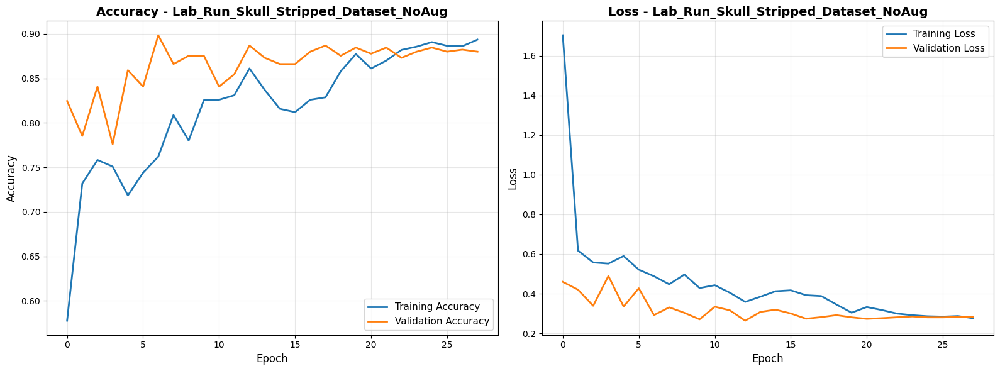

 Training plots saved

 LOADING BEST MODEL FOR EVALUATION



--- Evaluating on Test Set ---
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 242ms/step

 CLASSIFICATION REPORT

              precision    recall  f1-score   support

      glioma       0.92      0.83      0.87       201
  meningioma       0.74      0.87      0.80       119
   pituitary       0.99      0.99      0.99       152

    accuracy                           0.89       472
   macro avg       0.88      0.89      0.88       472
weighted avg       0.90      0.89      0.89       472

 Per-class metrics saved to CSV

 GENERATING CONFUSION MATRIX



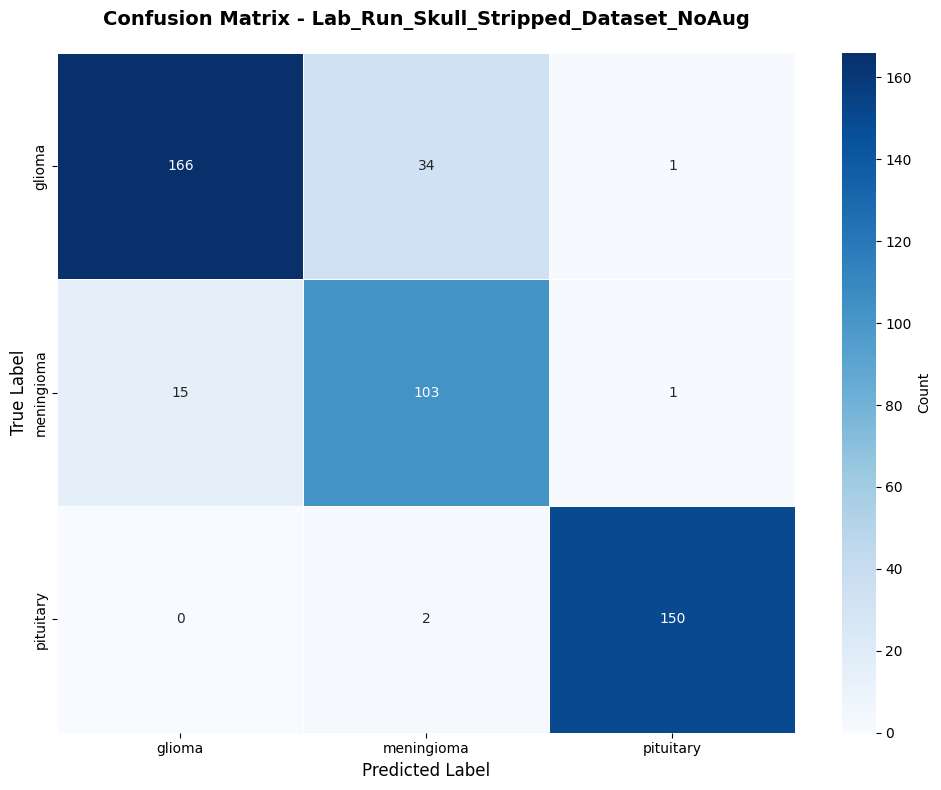

 Confusion matrix saved

 GENERATING ROC-AUC CURVES



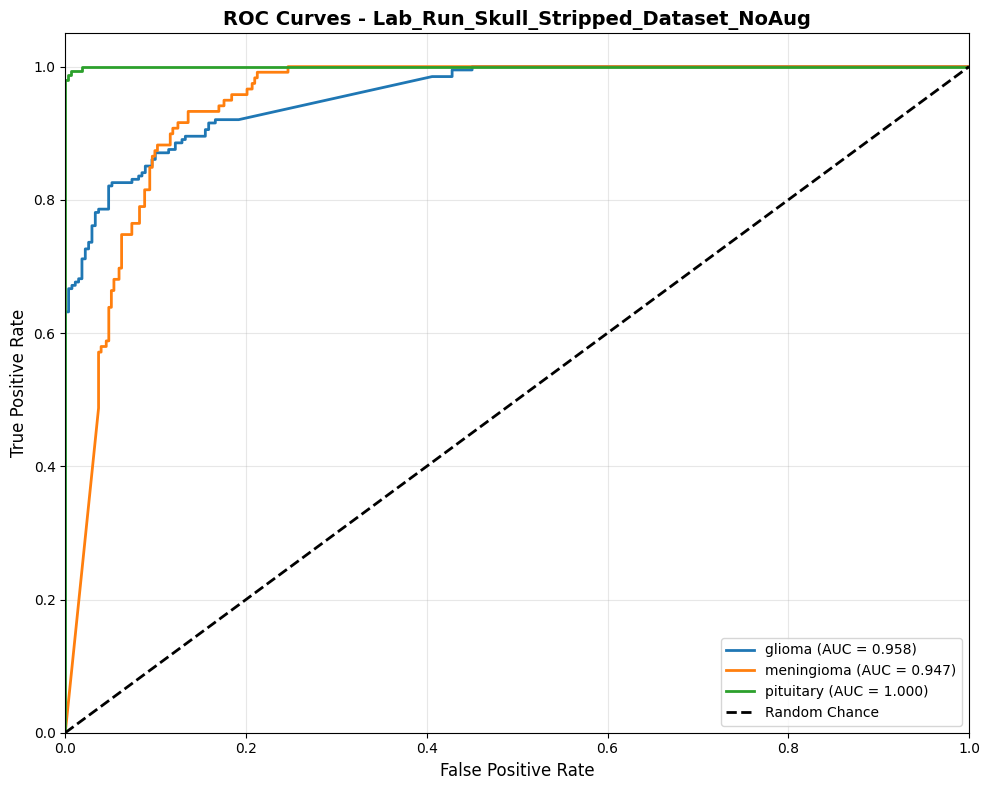

 ROC curves saved
   Mean AUC: 0.9682

 GENERATING GRAD-CAM VISUALIZATIONS

Using layer: block5_conv3

Generating 6-sample Grad-CAM grid...


/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['input_layer_2']]
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


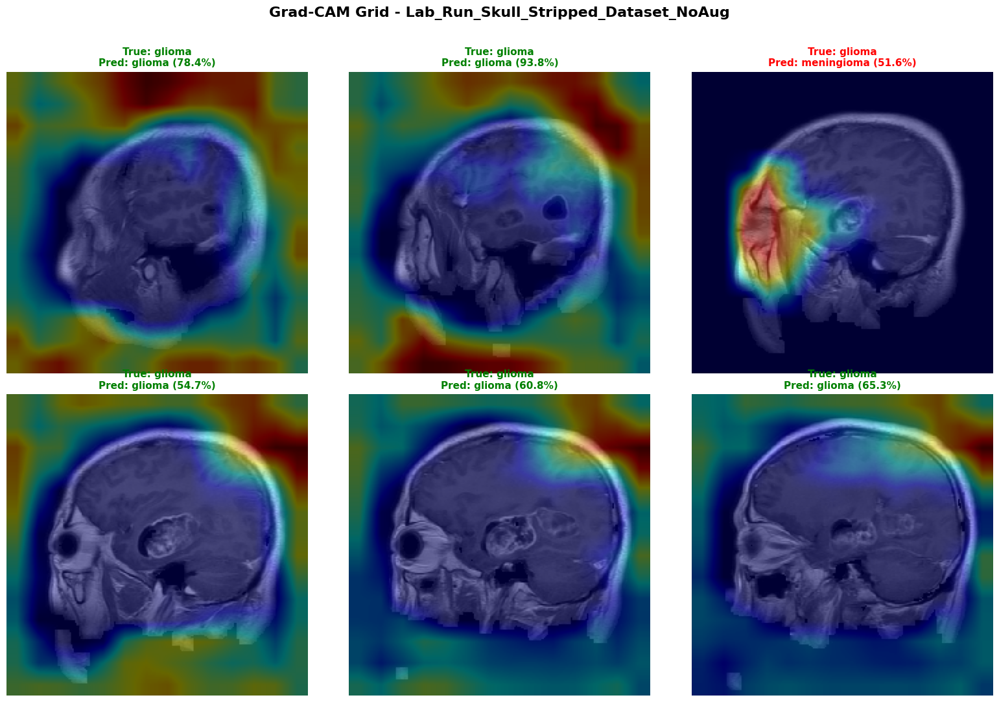

 Grad-CAM grid saved

Generating per-class Grad-CAM...


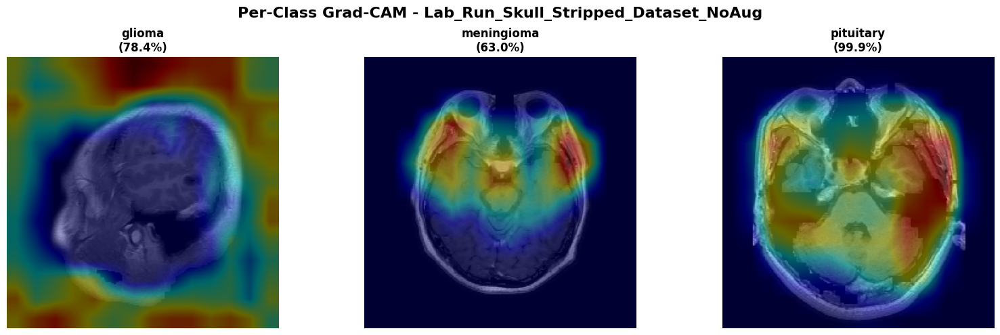

 Per-class Grad-CAM saved

 EXPERIMENT COMPLETE: Lab_Run_Skull_Stripped_Dataset_NoAug
 All results saved to: Lab_Run_Skull_Stripped_Dataset_NoAug/
 Total time: 0h 6m 57s
 Test Accuracy: 0.8877
 Mean AUC: 0.9682
 Overfitting Gap: 1.36%




In [ ]:
# RUN EXPERIMENT 4 Skull-Stripping
run_experiment(data_dir='Skull_Stripped_Dataset', use_augmentation=False)


 STARTING EXPERIMENT: Lab_Run_Denoised_Dataset_NoAug

 Data Augmentation: DISABLED
Found 2159 images belonging to 3 classes.
Found 433 images belonging to 3 classes.
Found 472 images belonging to 3 classes.
 Classes: ['glioma', 'meningioma', 'pituitary'] (Total: 3)
 Training samples: 2159
 Validation samples: 433
 Test samples: 472

 STAGE 1: Training with frozen VGG16 base



/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step - accuracy: 0.5038 - loss: 3.0571
Epoch 1: val_loss improved from inf to 0.42365, saving model to Lab_Run_Denoised_Dataset_NoAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 23s 284ms/step - accuracy: 0.5049 - loss: 3.0408 - val_accuracy: 0.8476 - val_loss: 0.4236 - learning_rate: 0.0010
Epoch 2/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.7140 - loss: 0.6884
Epoch 2: val_loss improved from 0.42365 to 0.37278, saving model to Lab_Run_Denoised_Dataset_NoAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 14s 207ms/step - accuracy: 0.7140 - loss: 0.6882 - val_accuracy: 0.8383 - val_loss: 0.3728 - learning_rate: 0.0010
Epoch 3/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - accuracy: 0.7234 - loss: 0.6075
Epoch 3: val_loss did not improve from 0.37278
68/68 ━━━━━━━━━━━━━━━━━━━━ 14s 201ms/step - accuracy: 0.7236 - loss: 0.6076 - val_accuracy: 0.8915 - val_loss: 0.4071 - learning_rate: 0.0010
Epoch 4/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.7569 - loss: 0.5724
Epoch 4: val_loss did not improve from 0.37278
68/68 ━━━━━━━━━━━━━━━━━━━━ 14s 198ms/step - accuracy: 0.7570 - loss: 0.5720 - val_accuracy: 0.8430 - val_loss: 0.3973 - learning_rate: 0.0010
Epoch 5/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.7418 - loss: 0.5794
Epoch 5: val_loss did not improve from 0.37278
68/68 ━━━━━━━━━━━━━━━━━━━━ 13s 195ms/step - accuracy: 0.7418 - loss: 0.5790 - val_accuracy: 0.8684 - val_loss: 0.3841 - learning_rate: 0.0010
Epoch 6/40
68/68 ━━━━━━━━━━━━━━━━

68/68 ━━━━━━━━━━━━━━━━━━━━ 14s 207ms/step - accuracy: 0.7904 - loss: 0.4904 - val_accuracy: 0.8522 - val_loss: 0.3709 - learning_rate: 0.0010
Epoch 7/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - accuracy: 0.7549 - loss: 0.5286
Epoch 7: val_loss improved from 0.37094 to 0.34650, saving model to Lab_Run_Denoised_Dataset_NoAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 14s 206ms/step - accuracy: 0.7548 - loss: 0.5286 - val_accuracy: 0.9007 - val_loss: 0.3465 - learning_rate: 0.0010
Epoch 8/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.7323 - loss: 0.5409
Epoch 8: val_loss improved from 0.34650 to 0.32233, saving model to Lab_Run_Denoised_Dataset_NoAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 14s 207ms/step - accuracy: 0.7325 - loss: 0.5406 - val_accuracy: 0.8822 - val_loss: 0.3223 - learning_rate: 0.0010
Epoch 9/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.7799 - loss: 0.4599
Epoch 9: val_loss did not improve from 0.32233
68/68 ━━━━━━━━━━━━━━━━━━━━ 13s 197ms/step - accuracy: 0.7800 - loss: 0.4599 - val_accuracy: 0.8591 - val_loss: 0.3544 - learning_rate: 0.0010
Epoch 10/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.7815 - loss: 0.4465
Epoch 10: val_loss did not improve from 0.32233
68/68 ━━━━━━━━━━━━━━━━━━━━ 13s 197ms/step - accuracy: 0.7815 - loss: 0.4466 - val_accuracy: 0.8314 - val_loss: 0.3845 - learning_rate: 0.0010
Epoch 11/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.7797 - loss: 0.4642
Epoch 11: val_loss improved from 0.32233 to 0.31813, saving model to Lab_Run_Denoised_Dataset_NoAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 14s 207ms/step - accuracy: 0.7796 - loss: 0.4643 - val_accuracy: 0.8730 - val_loss: 0.3181 - learning_rate: 0.0010
Epoch 12/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.7978 - loss: 0.4196
Epoch 12: val_loss improved from 0.31813 to 0.27041, saving model to Lab_Run_Denoised_Dataset_NoAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 14s 206ms/step - accuracy: 0.7978 - loss: 0.4197 - val_accuracy: 0.8961 - val_loss: 0.2704 - learning_rate: 0.0010
Epoch 13/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.8070 - loss: 0.4157
Epoch 13: val_loss improved from 0.27041 to 0.24759, saving model to Lab_Run_Denoised_Dataset_NoAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 14s 208ms/step - accuracy: 0.8067 - loss: 0.4161 - val_accuracy: 0.9053 - val_loss: 0.2476 - learning_rate: 0.0010
Epoch 14/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.7806 - loss: 0.4604
Epoch 14: val_loss did not improve from 0.24759
68/68 ━━━━━━━━━━━━━━━━━━━━ 13s 197ms/step - accuracy: 0.7809 - loss: 0.4601 - val_accuracy: 0.8915 - val_loss: 0.2847 - learning_rate: 0.0010
Epoch 15/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.8125 - loss: 0.4336
Epoch 15: val_loss did not improve from 0.24759
68/68 ━━━━━━━━━━━━━━━━━━━━ 13s 197ms/step - accuracy: 0.8123 - loss: 0.4336 - val_accuracy: 0.8545 - val_loss: 0.3004 - learning_rate: 0.0010
Epoch 16/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.7702 - loss: 0.4608
Epoch 16: val_loss did not improve from 0.24759
68/68 ━━━━━━━━━━━━━━━━━━━━ 13s 196ms/step - accuracy: 0.7705 - loss: 0.4604 - val_accuracy: 0.8938 - val_loss: 0.2541 - learning_rate: 0.0010
Epoch 17/40
68/68 ━━━━━━━━━

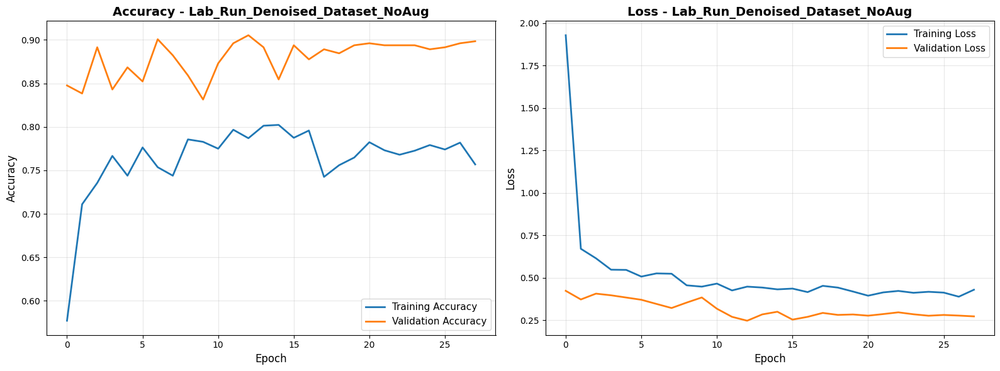

 Training plots saved

 LOADING BEST MODEL FOR EVALUATION



--- Evaluating on Test Set ---
15/15 ━━━━━━━━━━━━━━━━━━━━ 4s 222ms/step

 CLASSIFICATION REPORT

              precision    recall  f1-score   support

      glioma       0.85      0.90      0.87       201
  meningioma       0.83      0.71      0.76       119
   pituitary       0.96      0.99      0.97       152

    accuracy                           0.88       472
   macro avg       0.88      0.87      0.87       472
weighted avg       0.88      0.88      0.88       472

 Per-class metrics saved to CSV

 GENERATING CONFUSION MATRIX



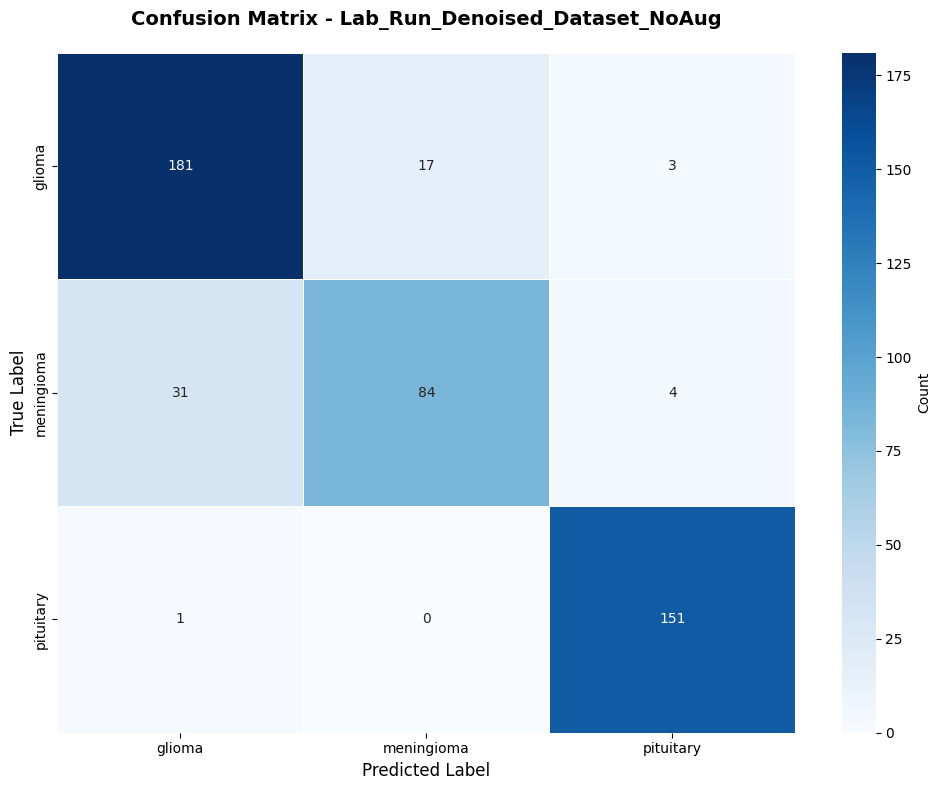

 Confusion matrix saved

 GENERATING ROC-AUC CURVES



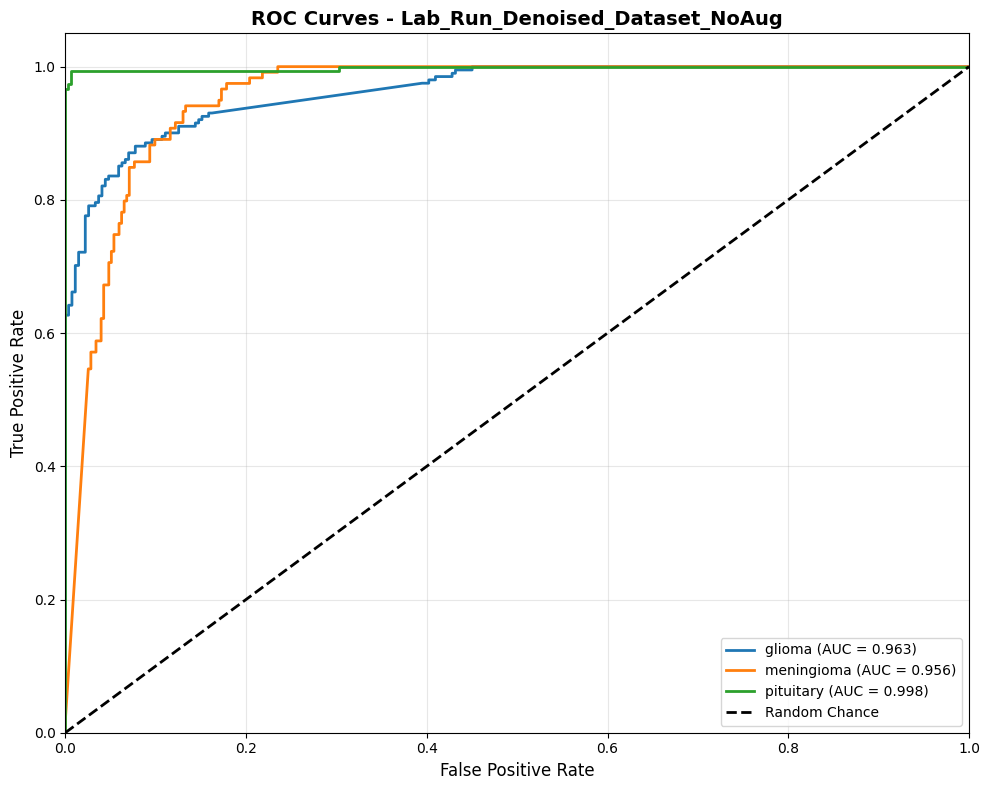

 ROC curves saved
   Mean AUC: 0.9726

 GENERATING GRAD-CAM VISUALIZATIONS

Using layer: block5_conv3

Generating 6-sample Grad-CAM grid...


/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['input_layer_2']]
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


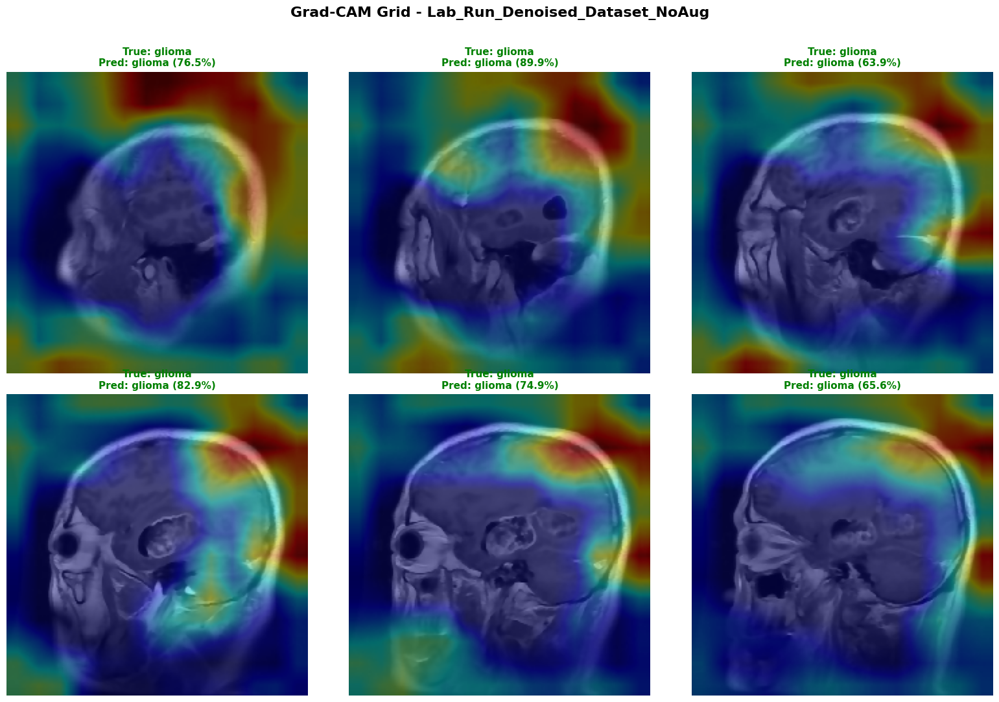

 Grad-CAM grid saved

Generating per-class Grad-CAM...


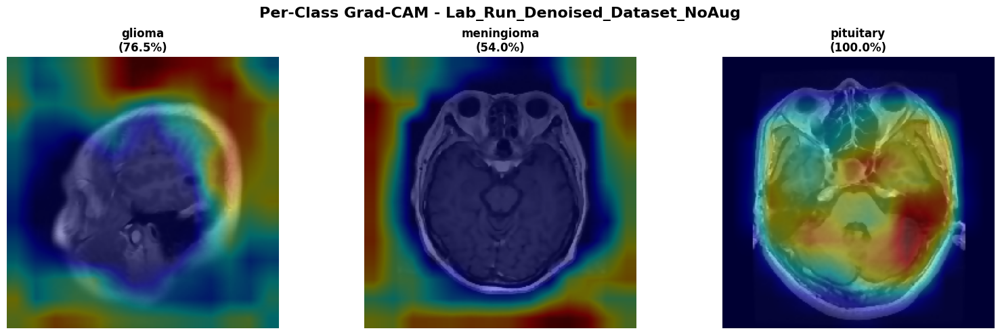

 Per-class Grad-CAM saved

 EXPERIMENT COMPLETE: Lab_Run_Denoised_Dataset_NoAug
 All results saved to: Lab_Run_Denoised_Dataset_NoAug/
 Total time: 0h 6m 30s
 Test Accuracy: 0.8814
 Mean AUC: 0.9726
 Overfitting Gap: -14.16%




In [ ]:
# RUN EXPERIMENT 5 Denoising
run_experiment(data_dir='Denoised_Dataset', use_augmentation=False)


 STARTING EXPERIMENT: Lab_Run_CLAHE_Dataset_WithAug

 Data Augmentation: ENABLED
Found 2159 images belonging to 3 classes.
Found 433 images belonging to 3 classes.
Found 472 images belonging to 3 classes.
 Classes: ['glioma', 'meningioma', 'pituitary'] (Total: 3)
 Training samples: 2159
 Validation samples: 433
 Test samples: 472

 STAGE 1: Training with frozen VGG16 base



/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 515ms/step - accuracy: 0.4121 - loss: 3.3213
Epoch 1: val_loss improved from inf to 0.56917, saving model to Lab_Run_CLAHE_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 48s 583ms/step - accuracy: 0.4132 - loss: 3.3055 - val_accuracy: 0.7806 - val_loss: 0.5692 - learning_rate: 0.0010
Epoch 2/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step - accuracy: 0.6257 - loss: 0.8187
Epoch 2: val_loss improved from 0.56917 to 0.55540, saving model to Lab_Run_CLAHE_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 36s 532ms/step - accuracy: 0.6258 - loss: 0.8186 - val_accuracy: 0.7552 - val_loss: 0.5554 - learning_rate: 0.0010
Epoch 3/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step - accuracy: 0.6555 - loss: 0.7408
Epoch 3: val_loss improved from 0.55540 to 0.49145, saving model to Lab_Run_CLAHE_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 36s 535ms/step - accuracy: 0.6557 - loss: 0.7406 - val_accuracy: 0.7945 - val_loss: 0.4915 - learning_rate: 0.0010
Epoch 4/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step - accuracy: 0.6373 - loss: 0.7570
Epoch 4: val_loss improved from 0.49145 to 0.48308, saving model to Lab_Run_CLAHE_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 36s 530ms/step - accuracy: 0.6375 - loss: 0.7569 - val_accuracy: 0.8037 - val_loss: 0.4831 - learning_rate: 0.0010
Epoch 5/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step - accuracy: 0.6513 - loss: 0.7434
Epoch 5: val_loss improved from 0.48308 to 0.41529, saving model to Lab_Run_CLAHE_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 36s 529ms/step - accuracy: 0.6512 - loss: 0.7435 - val_accuracy: 0.8129 - val_loss: 0.4153 - learning_rate: 0.0010
Epoch 6/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step - accuracy: 0.6736 - loss: 0.7123
Epoch 6: val_loss improved from 0.41529 to 0.40966, saving model to Lab_Run_CLAHE_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 36s 531ms/step - accuracy: 0.6736 - loss: 0.7123 - val_accuracy: 0.7968 - val_loss: 0.4097 - learning_rate: 0.0010
Epoch 7/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step - accuracy: 0.6766 - loss: 0.6991
Epoch 7: val_loss did not improve from 0.40966
68/68 ━━━━━━━━━━━━━━━━━━━━ 36s 523ms/step - accuracy: 0.6767 - loss: 0.6990 - val_accuracy: 0.7806 - val_loss: 0.4120 - learning_rate: 0.0010
Epoch 8/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step - accuracy: 0.7197 - loss: 0.6493
Epoch 8: val_loss did not improve from 0.40966
68/68 ━━━━━━━━━━━━━━━━━━━━ 35s 507ms/step - accuracy: 0.7194 - loss: 0.6495 - val_accuracy: 0.8152 - val_loss: 0.4462 - learning_rate: 0.0010
Epoch 9/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step - accuracy: 0.6886 - loss: 0.6955
Epoch 9: val_loss did not improve from 0.40966
68/68 ━━━━━━━━━━━━━━━━━━━━ 35s 511ms/step - accuracy: 0.6886 - loss: 0.6951 - val_accuracy: 0.8268 - val_loss: 0.4605 - learning_rate: 0.0010
Epoch 10/40
68/68 ━━━━━━━━━━━━━━━

68/68 ━━━━━━━━━━━━━━━━━━━━ 36s 530ms/step - accuracy: 0.6874 - loss: 0.6553 - val_accuracy: 0.8591 - val_loss: 0.4049 - learning_rate: 2.0000e-04
Epoch 13/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step - accuracy: 0.7340 - loss: 0.6042
Epoch 13: val_loss did not improve from 0.40487
68/68 ━━━━━━━━━━━━━━━━━━━━ 36s 523ms/step - accuracy: 0.7339 - loss: 0.6041 - val_accuracy: 0.8453 - val_loss: 0.4144 - learning_rate: 2.0000e-04
Epoch 14/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step - accuracy: 0.7172 - loss: 0.6205
Epoch 14: val_loss did not improve from 0.40487
68/68 ━━━━━━━━━━━━━━━━━━━━ 36s 523ms/step - accuracy: 0.7174 - loss: 0.6201 - val_accuracy: 0.8591 - val_loss: 0.4151 - learning_rate: 2.0000e-04
Epoch 15/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step - accuracy: 0.7411 - loss: 0.5644
Epoch 15: val_loss did not improve from 0.40487
68/68 ━━━━━━━━━━━━━━━━━━━━ 35s 508ms/step - accuracy: 0.7410 - loss: 0.5647 - val_accuracy: 0.8476 - val_loss: 0.4225 - learning_rate: 2.0000e-04
Epoch 16/40

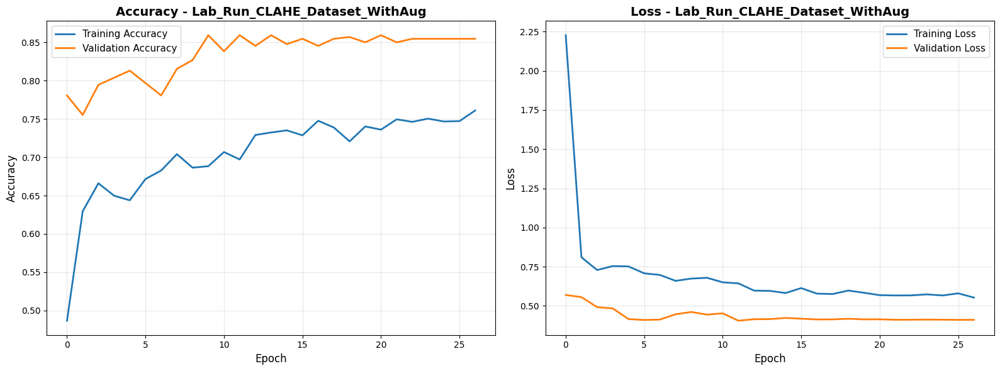

 Training plots saved

 LOADING BEST MODEL FOR EVALUATION



--- Evaluating on Test Set ---
15/15 ━━━━━━━━━━━━━━━━━━━━ 4s 209ms/step

 CLASSIFICATION REPORT

              precision    recall  f1-score   support

      glioma       0.87      0.85      0.86       201
  meningioma       0.70      0.61      0.65       119
   pituitary       0.86      0.97      0.91       152

    accuracy                           0.83       472
   macro avg       0.81      0.81      0.81       472
weighted avg       0.82      0.83      0.82       472

 Per-class metrics saved to CSV

 GENERATING CONFUSION MATRIX



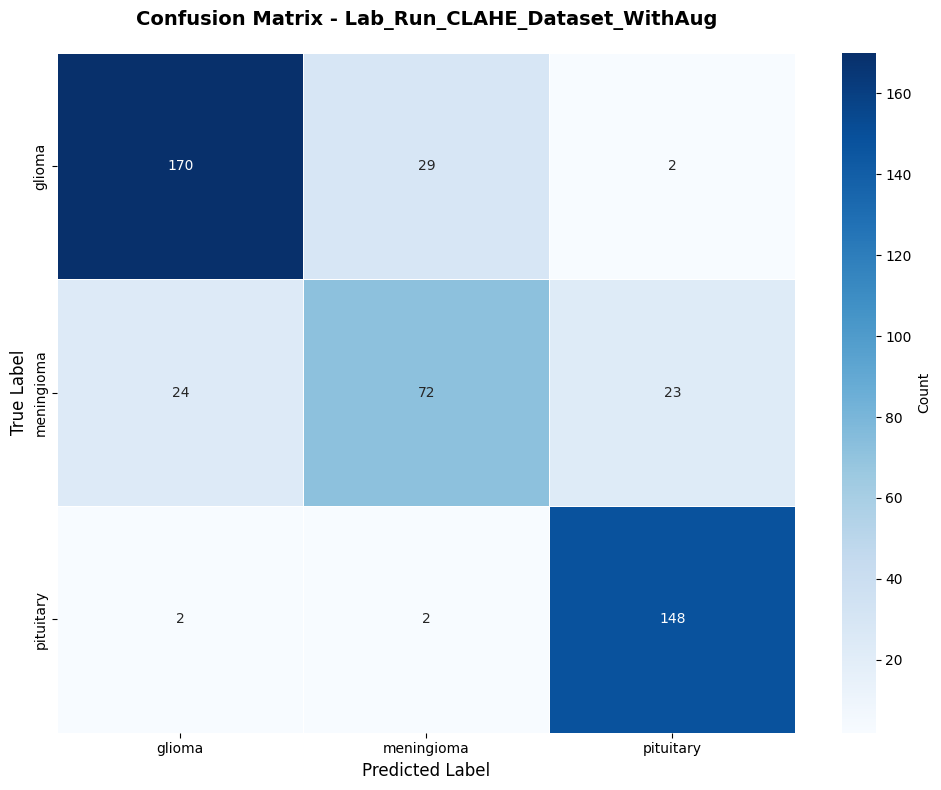

 Confusion matrix saved

 GENERATING ROC-AUC CURVES



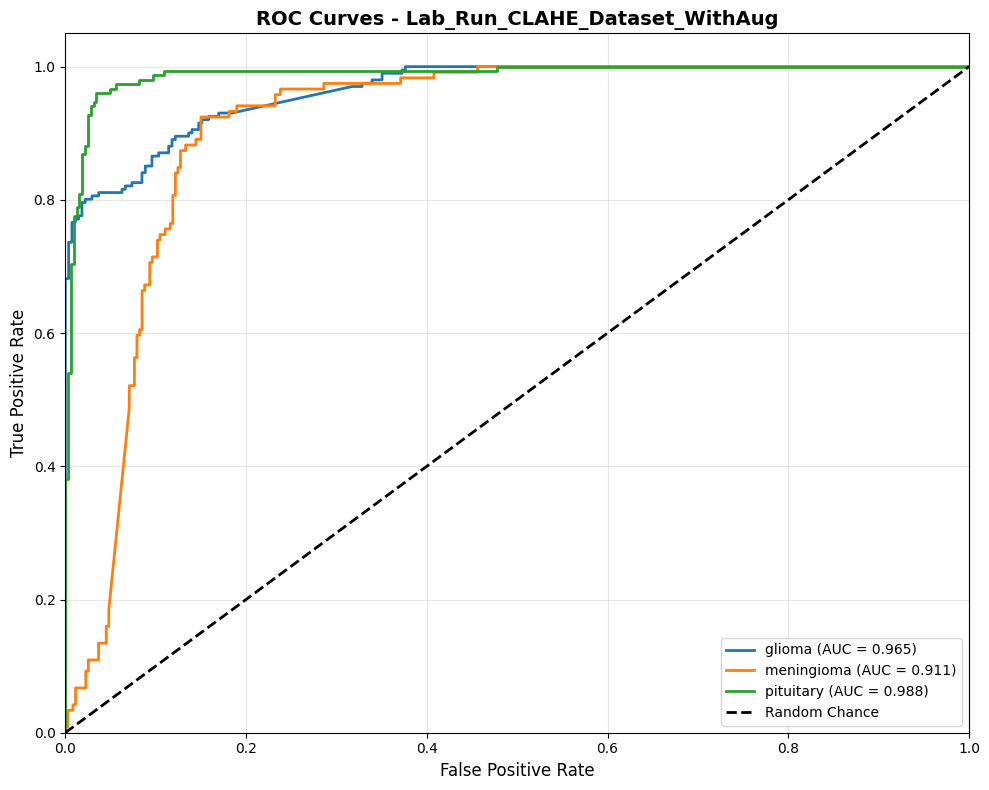

 ROC curves saved
   Mean AUC: 0.9545

 GENERATING GRAD-CAM VISUALIZATIONS

Using layer: block5_conv3

Generating 6-sample Grad-CAM grid...


/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['input_layer_1']]
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


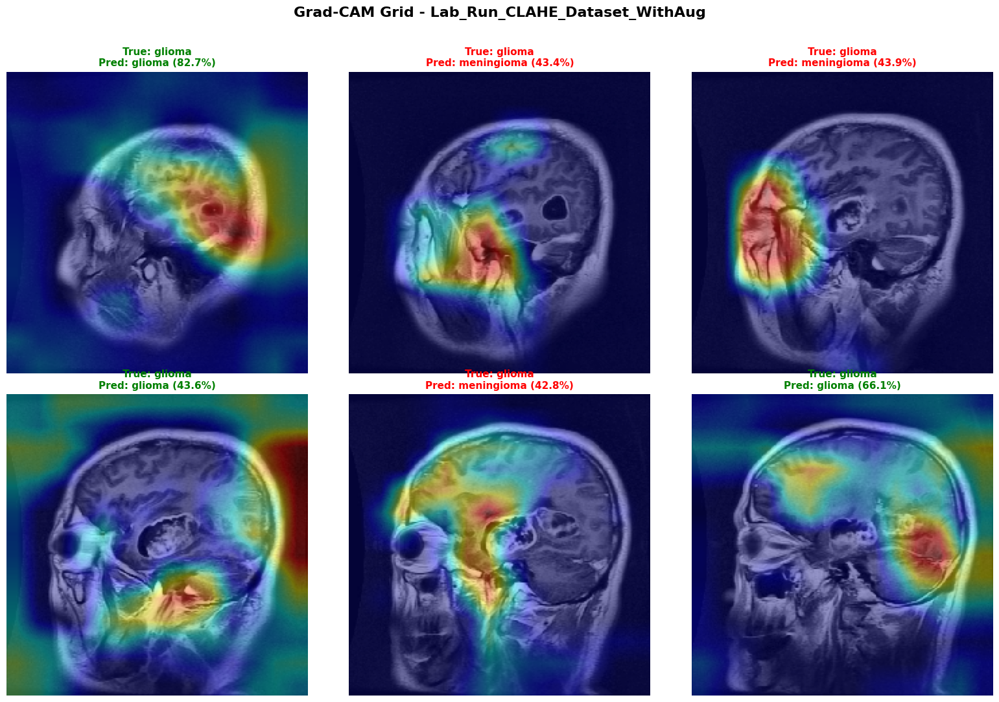

 Grad-CAM grid saved

Generating per-class Grad-CAM...


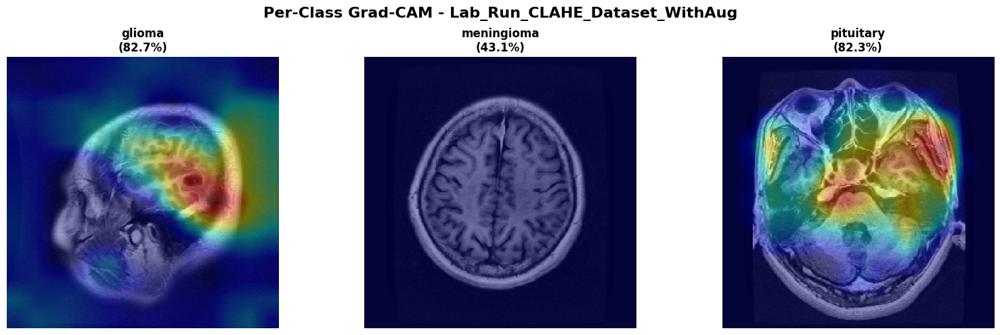

 Per-class Grad-CAM saved

 EXPERIMENT COMPLETE: Lab_Run_CLAHE_Dataset_WithAug
 All results saved to: Lab_Run_CLAHE_Dataset_WithAug/
 Total time: 0h 16m 16s
 Test Accuracy: 0.8263
 Mean AUC: 0.9545
 Overfitting Gap: -9.35%




In [ ]:
# RUN EXPERIMENT 6 CLAHE + Data Augmentation
run_experiment(data_dir='CLAHE_Dataset', use_augmentation=True)


 STARTING EXPERIMENT: Lab_Run_Skull_Stripped_Dataset_WithAug

 Data Augmentation: ENABLED
Found 2159 images belonging to 3 classes.
Found 433 images belonging to 3 classes.
Found 472 images belonging to 3 classes.
 Classes: ['glioma', 'meningioma', 'pituitary'] (Total: 3)
 Training samples: 2159
 Validation samples: 433
 Test samples: 472

 STAGE 1: Training with frozen VGG16 base



/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 502ms/step - accuracy: 0.4112 - loss: 3.3477
Epoch 1: val_loss improved from inf to 0.71499, saving model to Lab_Run_Skull_Stripped_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 42s 569ms/step - accuracy: 0.4119 - loss: 3.3305 - val_accuracy: 0.7367 - val_loss: 0.7150 - learning_rate: 0.0010
Epoch 2/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step - accuracy: 0.5619 - loss: 0.9134
Epoch 2: val_loss improved from 0.71499 to 0.52706, saving model to Lab_Run_Skull_Stripped_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 36s 524ms/step - accuracy: 0.5622 - loss: 0.9129 - val_accuracy: 0.7852 - val_loss: 0.5271 - learning_rate: 0.0010
Epoch 3/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step - accuracy: 0.5923 - loss: 0.8346
Epoch 3: val_loss did not improve from 0.52706
68/68 ━━━━━━━━━━━━━━━━━━━━ 35s 520ms/step - accuracy: 0.5919 - loss: 0.8349 - val_accuracy: 0.7829 - val_loss: 0.5308 - learning_rate: 0.0010
Epoch 4/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step - accuracy: 0.5954 - loss: 0.8201
Epoch 4: val_loss improved from 0.52706 to 0.49512, saving model to Lab_Run_Skull_Stripped_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 35s 520ms/step - accuracy: 0.5957 - loss: 0.8199 - val_accuracy: 0.7783 - val_loss: 0.4951 - learning_rate: 0.0010
Epoch 5/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step - accuracy: 0.6368 - loss: 0.7659
Epoch 5: val_loss did not improve from 0.49512
68/68 ━━━━━━━━━━━━━━━━━━━━ 34s 505ms/step - accuracy: 0.6368 - loss: 0.7658 - val_accuracy: 0.8083 - val_loss: 0.5801 - learning_rate: 0.0010
Epoch 6/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step - accuracy: 0.5787 - loss: 0.8194
Epoch 6: val_loss did not improve from 0.49512
68/68 ━━━━━━━━━━━━━━━━━━━━ 34s 497ms/step - accuracy: 0.5789 - loss: 0.8194 - val_accuracy: 0.8014 - val_loss: 0.5190 - learning_rate: 0.0010
Epoch 7/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step - accuracy: 0.6194 - loss: 0.7663
Epoch 7: val_loss did not improve from 0.49512
68/68 ━━━━━━━━━━━━━━━━━━━━ 35s 512ms/step - accuracy: 0.6192 - loss: 0.7665 - val_accuracy: 0.7621 - val_loss: 0.5763 - learning_rate: 0.0010
Epoch 8/40
68/68 ━━━━━━━━━━━━━━━━

68/68 ━━━━━━━━━━━━━━━━━━━━ 35s 511ms/step - accuracy: 0.5919 - loss: 0.8060 - val_accuracy: 0.8291 - val_loss: 0.4906 - learning_rate: 2.0000e-04
Epoch 11/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step - accuracy: 0.6453 - loss: 0.7467
Epoch 11: val_loss improved from 0.49061 to 0.48204, saving model to Lab_Run_Skull_Stripped_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 35s 509ms/step - accuracy: 0.6454 - loss: 0.7466 - val_accuracy: 0.7852 - val_loss: 0.4820 - learning_rate: 2.0000e-04
Epoch 12/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step - accuracy: 0.6426 - loss: 0.7071
Epoch 12: val_loss improved from 0.48204 to 0.45758, saving model to Lab_Run_Skull_Stripped_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 35s 511ms/step - accuracy: 0.6427 - loss: 0.7072 - val_accuracy: 0.8199 - val_loss: 0.4576 - learning_rate: 2.0000e-04
Epoch 13/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step - accuracy: 0.6632 - loss: 0.7068
Epoch 13: val_loss did not improve from 0.45758
68/68 ━━━━━━━━━━━━━━━━━━━━ 35s 516ms/step - accuracy: 0.6633 - loss: 0.7067 - val_accuracy: 0.8083 - val_loss: 0.4606 - learning_rate: 2.0000e-04
Epoch 14/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step - accuracy: 0.6743 - loss: 0.6910
Epoch 14: val_loss improved from 0.45758 to 0.44165, saving model to Lab_Run_Skull_Stripped_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 36s 525ms/step - accuracy: 0.6742 - loss: 0.6912 - val_accuracy: 0.8222 - val_loss: 0.4417 - learning_rate: 2.0000e-04
Epoch 15/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step - accuracy: 0.6648 - loss: 0.6873
Epoch 15: val_loss did not improve from 0.44165
68/68 ━━━━━━━━━━━━━━━━━━━━ 35s 510ms/step - accuracy: 0.6649 - loss: 0.6873 - val_accuracy: 0.8176 - val_loss: 0.4456 - learning_rate: 2.0000e-04
Epoch 16/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step - accuracy: 0.6579 - loss: 0.6931
Epoch 16: val_loss improved from 0.44165 to 0.43884, saving model to Lab_Run_Skull_Stripped_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 35s 512ms/step - accuracy: 0.6580 - loss: 0.6929 - val_accuracy: 0.8337 - val_loss: 0.4388 - learning_rate: 2.0000e-04
Epoch 17/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step - accuracy: 0.6872 - loss: 0.6602
Epoch 17: val_loss did not improve from 0.43884
68/68 ━━━━━━━━━━━━━━━━━━━━ 34s 504ms/step - accuracy: 0.6869 - loss: 0.6604 - val_accuracy: 0.8499 - val_loss: 0.4690 - learning_rate: 2.0000e-04
Epoch 18/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step - accuracy: 0.6758 - loss: 0.6595
Epoch 18: val_loss did not improve from 0.43884
68/68 ━━━━━━━━━━━━━━━━━━━━ 35s 512ms/step - accuracy: 0.6758 - loss: 0.6596 - val_accuracy: 0.8476 - val_loss: 0.4548 - learning_rate: 2.0000e-04
Epoch 19/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step - accuracy: 0.6841 - loss: 0.6432
Epoch 19: val_loss improved from 0.43884 to 0.43451, saving model to Lab_Run_Skull_Stripped_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 35s 517ms/step - accuracy: 0.6843 - loss: 0.6431 - val_accuracy: 0.8430 - val_loss: 0.4345 - learning_rate: 2.0000e-04
Epoch 20/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step - accuracy: 0.6761 - loss: 0.6558
Epoch 20: val_loss did not improve from 0.43451
68/68 ━━━━━━━━━━━━━━━━━━━━ 35s 519ms/step - accuracy: 0.6762 - loss: 0.6556 - val_accuracy: 0.8314 - val_loss: 0.4790 - learning_rate: 2.0000e-04
Epoch 21/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step - accuracy: 0.6985 - loss: 0.6451
Epoch 21: val_loss improved from 0.43451 to 0.42111, saving model to Lab_Run_Skull_Stripped_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 35s 514ms/step - accuracy: 0.6984 - loss: 0.6452 - val_accuracy: 0.8268 - val_loss: 0.4211 - learning_rate: 2.0000e-04
Epoch 22/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step - accuracy: 0.7052 - loss: 0.6429
Epoch 22: val_loss did not improve from 0.42111
68/68 ━━━━━━━━━━━━━━━━━━━━ 35s 510ms/step - accuracy: 0.7050 - loss: 0.6429 - val_accuracy: 0.8291 - val_loss: 0.4520 - learning_rate: 2.0000e-04
Epoch 23/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step - accuracy: 0.6796 - loss: 0.6382
Epoch 23: val_loss did not improve from 0.42111
68/68 ━━━━━━━━━━━━━━━━━━━━ 34s 500ms/step - accuracy: 0.6796 - loss: 0.6383 - val_accuracy: 0.8222 - val_loss: 0.4685 - learning_rate: 2.0000e-04
Epoch 24/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step - accuracy: 0.6720 - loss: 0.6742
Epoch 24: val_loss did not improve from 0.42111
68/68 ━━━━━━━━━━━━━━━━━━━━ 35s 507ms/step - accuracy: 0.6720 - loss: 0.6740 - val_accuracy: 0.8314 - val_loss: 0.4592 - learning_rate: 2.0000e-04
Epoch 25/40

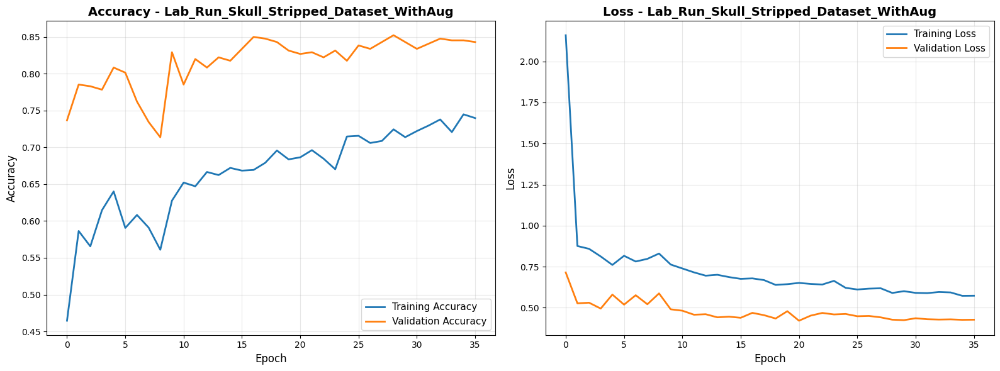

 Training plots saved

 LOADING BEST MODEL FOR EVALUATION



--- Evaluating on Test Set ---
15/15 ━━━━━━━━━━━━━━━━━━━━ 4s 208ms/step

 CLASSIFICATION REPORT

              precision    recall  f1-score   support

      glioma       0.86      0.85      0.86       201
  meningioma       0.77      0.53      0.63       119
   pituitary       0.79      1.00      0.88       152

    accuracy                           0.82       472
   macro avg       0.81      0.79      0.79       472
weighted avg       0.82      0.82      0.81       472

 Per-class metrics saved to CSV

 GENERATING CONFUSION MATRIX



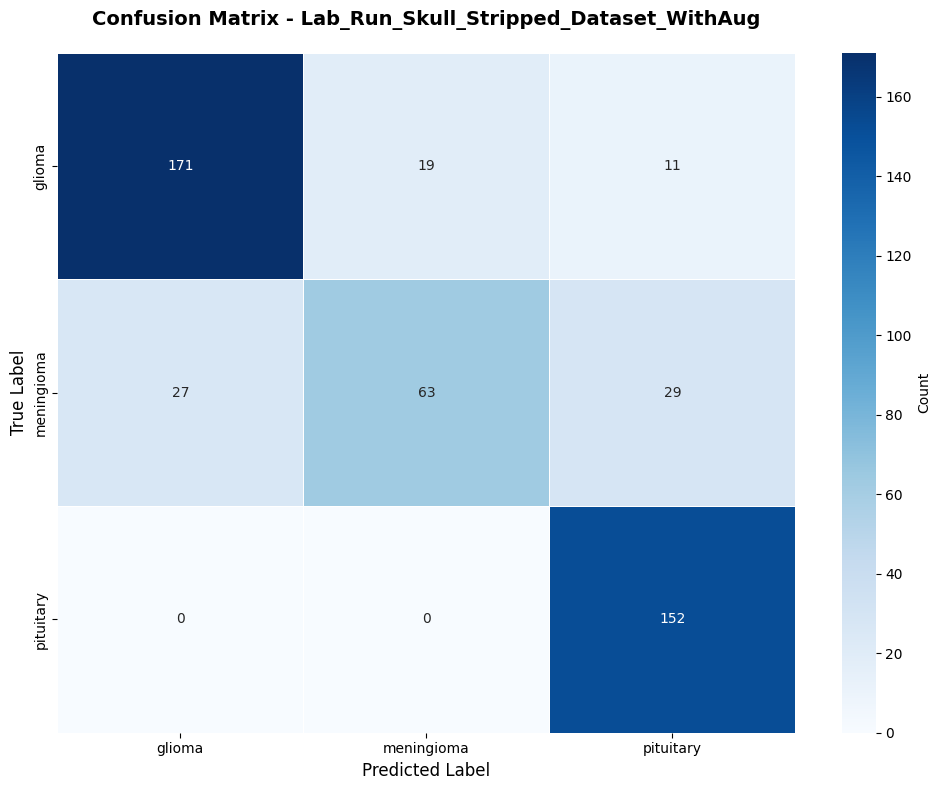

 Confusion matrix saved

 GENERATING ROC-AUC CURVES



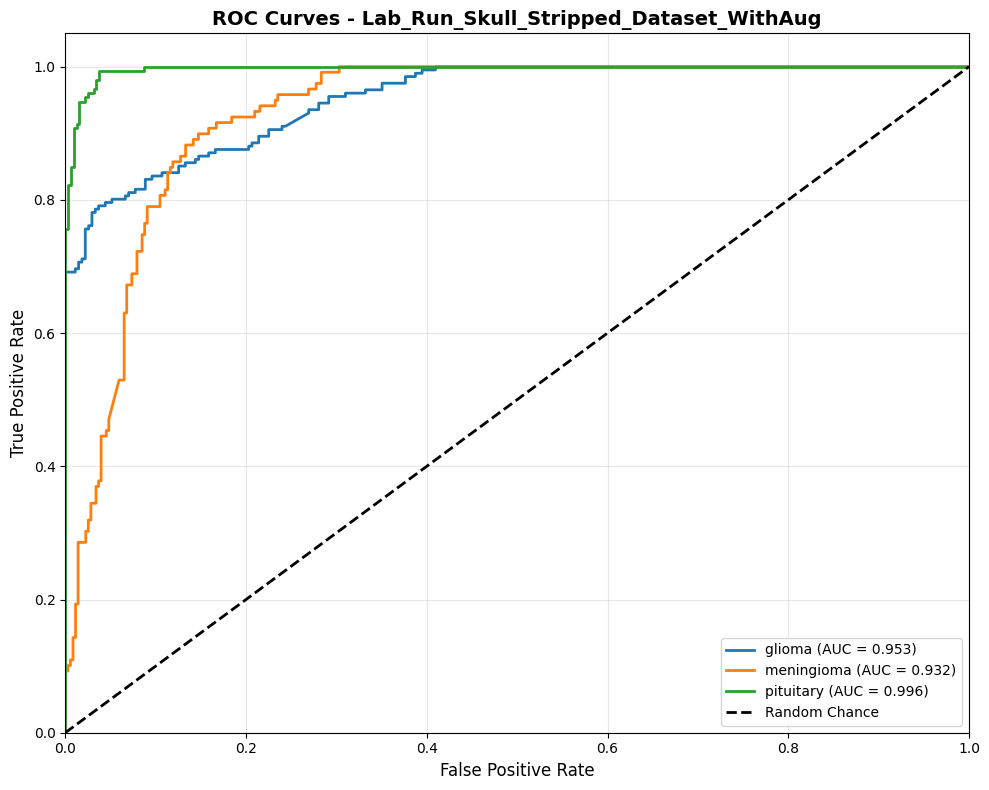

 ROC curves saved
   Mean AUC: 0.9603

 GENERATING GRAD-CAM VISUALIZATIONS

Using layer: block5_conv3

Generating 6-sample Grad-CAM grid...


/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['input_layer_3']]
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


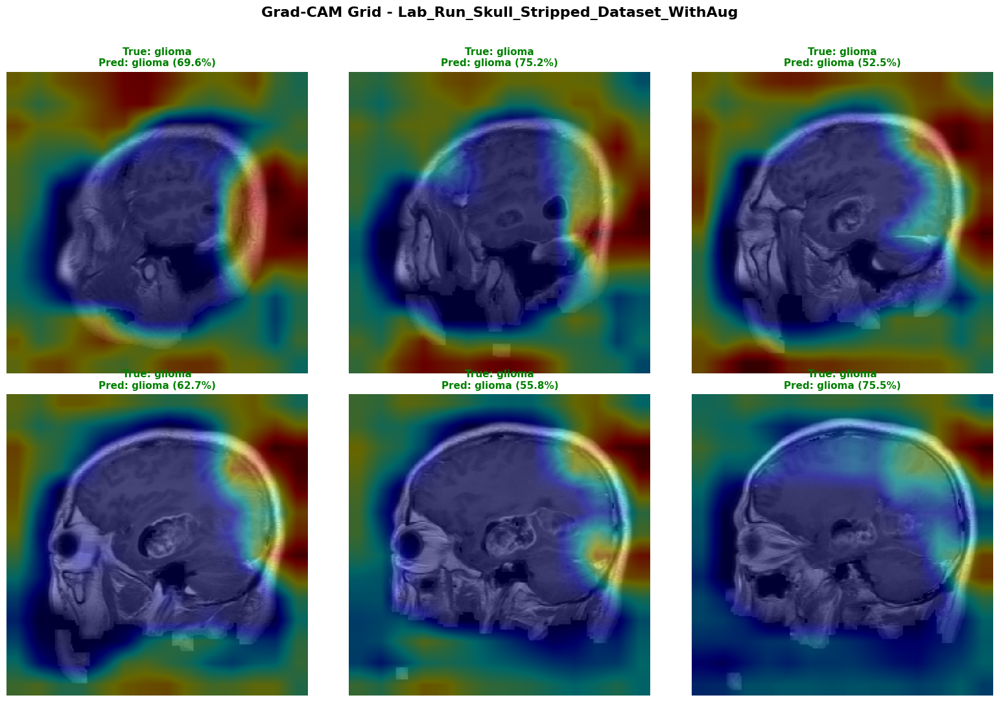

 Grad-CAM grid saved

Generating per-class Grad-CAM...


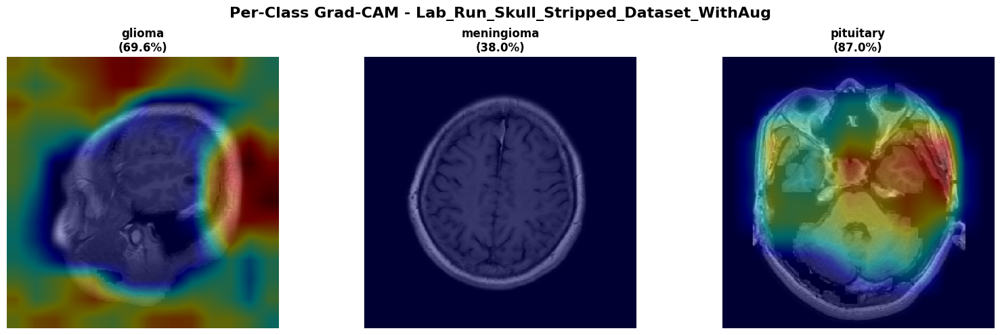

 Per-class Grad-CAM saved

 EXPERIMENT COMPLETE: Lab_Run_Skull_Stripped_Dataset_WithAug
 All results saved to: Lab_Run_Skull_Stripped_Dataset_WithAug/
 Total time: 0h 21m 5s
 Test Accuracy: 0.8178
 Mean AUC: 0.9603
 Overfitting Gap: -10.33%




In [ ]:
# RUN EXPERIMENT 7 Skull-Stripping + Augmentation
run_experiment(data_dir='Skull_Stripped_Dataset', use_augmentation=True)


 STARTING EXPERIMENT: Lab_Run_Denoised_Dataset_WithAug

 Data Augmentation: ENABLED
Found 2159 images belonging to 3 classes.
Found 433 images belonging to 3 classes.
Found 472 images belonging to 3 classes.
 Classes: ['glioma', 'meningioma', 'pituitary'] (Total: 3)
 Training samples: 2159
 Validation samples: 433
 Test samples: 472

 STAGE 1: Training with frozen VGG16 base



/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step - accuracy: 0.4066 - loss: 3.2554
Epoch 1: val_loss improved from inf to 0.81337, saving model to Lab_Run_Denoised_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 40s 518ms/step - accuracy: 0.4074 - loss: 3.2398 - val_accuracy: 0.7367 - val_loss: 0.8134 - learning_rate: 0.0010
Epoch 2/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step - accuracy: 0.5755 - loss: 0.9005
Epoch 2: val_loss improved from 0.81337 to 0.63755, saving model to Lab_Run_Denoised_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 32s 469ms/step - accuracy: 0.5757 - loss: 0.9004 - val_accuracy: 0.7436 - val_loss: 0.6375 - learning_rate: 0.0010
Epoch 3/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step - accuracy: 0.6046 - loss: 0.8415
Epoch 3: val_loss improved from 0.63755 to 0.58390, saving model to Lab_Run_Denoised_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 33s 479ms/step - accuracy: 0.6046 - loss: 0.8417 - val_accuracy: 0.7852 - val_loss: 0.5839 - learning_rate: 0.0010
Epoch 4/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step - accuracy: 0.6055 - loss: 0.8664
Epoch 4: val_loss improved from 0.58390 to 0.55781, saving model to Lab_Run_Denoised_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 32s 474ms/step - accuracy: 0.6053 - loss: 0.8662 - val_accuracy: 0.7552 - val_loss: 0.5578 - learning_rate: 0.0010
Epoch 5/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step - accuracy: 0.6085 - loss: 0.8348
Epoch 5: val_loss did not improve from 0.55781
68/68 ━━━━━━━━━━━━━━━━━━━━ 41s 470ms/step - accuracy: 0.6085 - loss: 0.8348 - val_accuracy: 0.8245 - val_loss: 0.5585 - learning_rate: 0.0010
Epoch 6/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step - accuracy: 0.6115 - loss: 0.7940
Epoch 6: val_loss improved from 0.55781 to 0.53642, saving model to Lab_Run_Denoised_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 32s 469ms/step - accuracy: 0.6113 - loss: 0.7944 - val_accuracy: 0.7829 - val_loss: 0.5364 - learning_rate: 0.0010
Epoch 7/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step - accuracy: 0.5945 - loss: 0.8401
Epoch 7: val_loss improved from 0.53642 to 0.50321, saving model to Lab_Run_Denoised_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 32s 467ms/step - accuracy: 0.5942 - loss: 0.8398 - val_accuracy: 0.7875 - val_loss: 0.5032 - learning_rate: 0.0010
Epoch 8/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step - accuracy: 0.5519 - loss: 0.8001
Epoch 8: val_loss improved from 0.50321 to 0.49603, saving model to Lab_Run_Denoised_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 33s 483ms/step - accuracy: 0.5520 - loss: 0.8005 - val_accuracy: 0.8453 - val_loss: 0.4960 - learning_rate: 0.0010
Epoch 9/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step - accuracy: 0.5563 - loss: 0.8741
Epoch 9: val_loss improved from 0.49603 to 0.49117, saving model to Lab_Run_Denoised_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 32s 470ms/step - accuracy: 0.5563 - loss: 0.8741 - val_accuracy: 0.8129 - val_loss: 0.4912 - learning_rate: 0.0010
Epoch 10/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step - accuracy: 0.5698 - loss: 0.8364
Epoch 10: val_loss did not improve from 0.49117
68/68 ━━━━━━━━━━━━━━━━━━━━ 41s 468ms/step - accuracy: 0.5693 - loss: 0.8367 - val_accuracy: 0.5889 - val_loss: 0.7049 - learning_rate: 0.0010
Epoch 11/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step - accuracy: 0.5561 - loss: 0.8757
Epoch 11: val_loss improved from 0.49117 to 0.46119, saving model to Lab_Run_Denoised_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 32s 466ms/step - accuracy: 0.5566 - loss: 0.8753 - val_accuracy: 0.8152 - val_loss: 0.4612 - learning_rate: 0.0010
Epoch 12/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step - accuracy: 0.5980 - loss: 0.8141
Epoch 12: val_loss improved from 0.46119 to 0.42810, saving model to Lab_Run_Denoised_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 32s 468ms/step - accuracy: 0.5981 - loss: 0.8137 - val_accuracy: 0.8614 - val_loss: 0.4281 - learning_rate: 0.0010
Epoch 13/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step - accuracy: 0.6376 - loss: 0.7630
Epoch 13: val_loss did not improve from 0.42810
68/68 ━━━━━━━━━━━━━━━━━━━━ 32s 471ms/step - accuracy: 0.6375 - loss: 0.7630 - val_accuracy: 0.7413 - val_loss: 0.4993 - learning_rate: 0.0010
Epoch 14/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step - accuracy: 0.6422 - loss: 0.7667
Epoch 14: val_loss did not improve from 0.42810
68/68 ━━━━━━━━━━━━━━━━━━━━ 31s 456ms/step - accuracy: 0.6419 - loss: 0.7668 - val_accuracy: 0.8684 - val_loss: 0.4697 - learning_rate: 0.0010
Epoch 15/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step - accuracy: 0.6377 - loss: 0.7452
Epoch 15: val_loss did not improve from 0.42810
68/68 ━━━━━━━━━━━━━━━━━━━━ 32s 469ms/step - accuracy: 0.6379 - loss: 0.7451 - val_accuracy: 0.8545 - val_loss: 0.4449 - learning_rate: 0.0010
Epoch 16/40
68/68 ━━━━━━━━━

68/68 ━━━━━━━━━━━━━━━━━━━━ 33s 478ms/step - accuracy: 0.6280 - loss: 0.7228 - val_accuracy: 0.8614 - val_loss: 0.4174 - learning_rate: 2.0000e-04
Epoch 19/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step - accuracy: 0.6470 - loss: 0.7158
Epoch 19: val_loss improved from 0.41736 to 0.41360, saving model to Lab_Run_Denoised_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 32s 473ms/step - accuracy: 0.6470 - loss: 0.7157 - val_accuracy: 0.8661 - val_loss: 0.4136 - learning_rate: 2.0000e-04
Epoch 20/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step - accuracy: 0.6439 - loss: 0.7150
Epoch 20: val_loss did not improve from 0.41360
68/68 ━━━━━━━━━━━━━━━━━━━━ 32s 459ms/step - accuracy: 0.6440 - loss: 0.7149 - val_accuracy: 0.8684 - val_loss: 0.4232 - learning_rate: 2.0000e-04
Epoch 21/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step - accuracy: 0.6342 - loss: 0.7140
Epoch 21: val_loss did not improve from 0.41360
68/68 ━━━━━━━━━━━━━━━━━━━━ 32s 476ms/step - accuracy: 0.6344 - loss: 0.7139 - val_accuracy: 0.8637 - val_loss: 0.4408 - learning_rate: 2.0000e-04
Epoch 22/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step - accuracy: 0.6545 - loss: 0.7080
Epoch 22: val_loss improved from 0.41360 to 0.40702, saving model to Lab_Run_Denoised_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 32s 465ms/step - accuracy: 0.6545 - loss: 0.7079 - val_accuracy: 0.8614 - val_loss: 0.4070 - learning_rate: 2.0000e-04
Epoch 23/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step - accuracy: 0.6467 - loss: 0.7425
Epoch 23: val_loss improved from 0.40702 to 0.40074, saving model to Lab_Run_Denoised_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 32s 474ms/step - accuracy: 0.6469 - loss: 0.7420 - val_accuracy: 0.8684 - val_loss: 0.4007 - learning_rate: 2.0000e-04
Epoch 24/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step - accuracy: 0.6526 - loss: 0.7073
Epoch 24: val_loss did not improve from 0.40074
68/68 ━━━━━━━━━━━━━━━━━━━━ 31s 463ms/step - accuracy: 0.6527 - loss: 0.7071 - val_accuracy: 0.8291 - val_loss: 0.4159 - learning_rate: 2.0000e-04
Epoch 25/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step - accuracy: 0.6893 - loss: 0.6651
Epoch 25: val_loss did not improve from 0.40074
68/68 ━━━━━━━━━━━━━━━━━━━━ 32s 464ms/step - accuracy: 0.6892 - loss: 0.6652 - val_accuracy: 0.8684 - val_loss: 0.4207 - learning_rate: 2.0000e-04
Epoch 26/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step - accuracy: 0.6586 - loss: 0.7024
Epoch 26: val_loss did not improve from 0.40074
68/68 ━━━━━━━━━━━━━━━━━━━━ 32s 468ms/step - accuracy: 0.6587 - loss: 0.7023 - val_accuracy: 0.8776 - val_loss: 0.4130 - learning_rate: 2.0000e-04
Epoch 27/40

68/68 ━━━━━━━━━━━━━━━━━━━━ 32s 469ms/step - accuracy: 0.6830 - loss: 0.6761 - val_accuracy: 0.8799 - val_loss: 0.4002 - learning_rate: 2.0000e-04
Epoch 28/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step - accuracy: 0.6850 - loss: 0.6728
Epoch 28: val_loss did not improve from 0.40018
68/68 ━━━━━━━━━━━━━━━━━━━━ 32s 460ms/step - accuracy: 0.6850 - loss: 0.6729 - val_accuracy: 0.8730 - val_loss: 0.4021 - learning_rate: 2.0000e-04
Epoch 29/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step - accuracy: 0.6468 - loss: 0.7133
Epoch 29: val_loss did not improve from 0.40018
68/68 ━━━━━━━━━━━━━━━━━━━━ 32s 465ms/step - accuracy: 0.6472 - loss: 0.7129 - val_accuracy: 0.8661 - val_loss: 0.4078 - learning_rate: 2.0000e-04
Epoch 30/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step - accuracy: 0.6722 - loss: 0.6841
Epoch 30: val_loss improved from 0.40018 to 0.39955, saving model to Lab_Run_Denoised_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 32s 464ms/step - accuracy: 0.6723 - loss: 0.6839 - val_accuracy: 0.8730 - val_loss: 0.3996 - learning_rate: 2.0000e-04
Epoch 31/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step - accuracy: 0.7069 - loss: 0.6670
Epoch 31: val_loss did not improve from 0.39955
68/68 ━━━━━━━━━━━━━━━━━━━━ 32s 468ms/step - accuracy: 0.7068 - loss: 0.6670 - val_accuracy: 0.8730 - val_loss: 0.4076 - learning_rate: 2.0000e-04
Epoch 32/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step - accuracy: 0.7055 - loss: 0.6568
Epoch 32: val_loss did not improve from 0.39955
68/68 ━━━━━━━━━━━━━━━━━━━━ 31s 459ms/step - accuracy: 0.7054 - loss: 0.6569 - val_accuracy: 0.8591 - val_loss: 0.4135 - learning_rate: 2.0000e-04
Epoch 33/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step - accuracy: 0.6952 - loss: 0.6681
Epoch 33: val_loss improved from 0.39955 to 0.38605, saving model to Lab_Run_Denoised_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 32s 469ms/step - accuracy: 0.6953 - loss: 0.6680 - val_accuracy: 0.8915 - val_loss: 0.3861 - learning_rate: 2.0000e-04
Epoch 34/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step - accuracy: 0.7014 - loss: 0.6430
Epoch 34: val_loss improved from 0.38605 to 0.38074, saving model to Lab_Run_Denoised_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 33s 478ms/step - accuracy: 0.7015 - loss: 0.6430 - val_accuracy: 0.8614 - val_loss: 0.3807 - learning_rate: 2.0000e-04
Epoch 35/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step - accuracy: 0.7132 - loss: 0.6249
Epoch 35: val_loss did not improve from 0.38074
68/68 ━━━━━━━━━━━━━━━━━━━━ 32s 466ms/step - accuracy: 0.7133 - loss: 0.6248 - val_accuracy: 0.8730 - val_loss: 0.4108 - learning_rate: 2.0000e-04
Epoch 36/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step - accuracy: 0.7373 - loss: 0.6134
Epoch 36: val_loss did not improve from 0.38074
68/68 ━━━━━━━━━━━━━━━━━━━━ 32s 464ms/step - accuracy: 0.7371 - loss: 0.6136 - val_accuracy: 0.8684 - val_loss: 0.4279 - learning_rate: 2.0000e-04
Epoch 37/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step - accuracy: 0.7120 - loss: 0.6381
Epoch 37: val_loss did not improve from 0.38074
68/68 ━━━━━━━━━━━━━━━━━━━━ 40s 462ms/step - accuracy: 0.7122 - loss: 0.6381 - val_accuracy: 0.8707 - val_loss: 0.3829 - learning_rate: 2.0000e-04
Epoch 38/40

68/68 ━━━━━━━━━━━━━━━━━━━━ 42s 480ms/step - accuracy: 0.7350 - loss: 0.6223 - val_accuracy: 0.8545 - val_loss: 0.3693 - learning_rate: 2.0000e-04
Epoch 39/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step - accuracy: 0.7477 - loss: 0.5887
Epoch 39: val_loss did not improve from 0.36934
68/68 ━━━━━━━━━━━━━━━━━━━━ 32s 464ms/step - accuracy: 0.7475 - loss: 0.5889 - val_accuracy: 0.8707 - val_loss: 0.3789 - learning_rate: 2.0000e-04
Epoch 40/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step - accuracy: 0.7449 - loss: 0.5914
Epoch 40: val_loss improved from 0.36934 to 0.36846, saving model to Lab_Run_Denoised_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 32s 468ms/step - accuracy: 0.7449 - loss: 0.5914 - val_accuracy: 0.8684 - val_loss: 0.3685 - learning_rate: 2.0000e-04

 STAGE 2: Fine-tuning from block4_conv1

Epoch 41/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 506ms/step - accuracy: 0.6550 - loss: 0.7506
Epoch 41: val_loss improved from 0.36846 to 0.35969, saving model to Lab_Run_Denoised_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 46s 578ms/step - accuracy: 0.6554 - loss: 0.7498 - val_accuracy: 0.8568 - val_loss: 0.3597 - learning_rate: 1.0000e-05
Epoch 42/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step - accuracy: 0.7361 - loss: 0.5922
Epoch 42: val_loss improved from 0.35969 to 0.35797, saving model to Lab_Run_Denoised_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 35s 519ms/step - accuracy: 0.7362 - loss: 0.5921 - val_accuracy: 0.8661 - val_loss: 0.3580 - learning_rate: 1.0000e-05
Epoch 43/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step - accuracy: 0.7313 - loss: 0.6237
Epoch 43: val_loss improved from 0.35797 to 0.30808, saving model to Lab_Run_Denoised_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 35s 519ms/step - accuracy: 0.7314 - loss: 0.6235 - val_accuracy: 0.8868 - val_loss: 0.3081 - learning_rate: 1.0000e-05
Epoch 44/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step - accuracy: 0.7358 - loss: 0.6058
Epoch 44: val_loss did not improve from 0.30808
68/68 ━━━━━━━━━━━━━━━━━━━━ 34s 500ms/step - accuracy: 0.7362 - loss: 0.6053 - val_accuracy: 0.8430 - val_loss: 0.3694 - learning_rate: 1.0000e-05
Epoch 45/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step - accuracy: 0.7383 - loss: 0.5854
Epoch 45: val_loss improved from 0.30808 to 0.28595, saving model to Lab_Run_Denoised_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 35s 515ms/step - accuracy: 0.7385 - loss: 0.5852 - val_accuracy: 0.8961 - val_loss: 0.2860 - learning_rate: 1.0000e-05
Epoch 46/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step - accuracy: 0.7580 - loss: 0.5475
Epoch 46: val_loss did not improve from 0.28595
68/68 ━━━━━━━━━━━━━━━━━━━━ 34s 496ms/step - accuracy: 0.7580 - loss: 0.5474 - val_accuracy: 0.9030 - val_loss: 0.2935 - learning_rate: 1.0000e-05
Epoch 47/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step - accuracy: 0.7886 - loss: 0.5097
Epoch 47: val_loss improved from 0.28595 to 0.26697, saving model to Lab_Run_Denoised_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 36s 524ms/step - accuracy: 0.7885 - loss: 0.5098 - val_accuracy: 0.9030 - val_loss: 0.2670 - learning_rate: 1.0000e-05
Epoch 48/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step - accuracy: 0.7806 - loss: 0.5165
Epoch 48: val_loss did not improve from 0.26697
68/68 ━━━━━━━━━━━━━━━━━━━━ 35s 506ms/step - accuracy: 0.7806 - loss: 0.5164 - val_accuracy: 0.9007 - val_loss: 0.2695 - learning_rate: 1.0000e-05
Epoch 49/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step - accuracy: 0.7719 - loss: 0.5365
Epoch 49: val_loss improved from 0.26697 to 0.24207, saving model to Lab_Run_Denoised_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 36s 526ms/step - accuracy: 0.7720 - loss: 0.5362 - val_accuracy: 0.8984 - val_loss: 0.2421 - learning_rate: 1.0000e-05
Epoch 50/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step - accuracy: 0.7978 - loss: 0.4746
Epoch 50: val_loss did not improve from 0.24207
68/68 ━━━━━━━━━━━━━━━━━━━━ 34s 504ms/step - accuracy: 0.7979 - loss: 0.4747 - val_accuracy: 0.8707 - val_loss: 0.2971 - learning_rate: 1.0000e-05
Epoch 51/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step - accuracy: 0.7943 - loss: 0.4928
Epoch 51: val_loss did not improve from 0.24207
68/68 ━━━━━━━━━━━━━━━━━━━━ 34s 501ms/step - accuracy: 0.7944 - loss: 0.4926 - val_accuracy: 0.9169 - val_loss: 0.2512 - learning_rate: 1.0000e-05
Epoch 52/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step - accuracy: 0.8140 - loss: 0.4697
Epoch 52: val_loss did not improve from 0.24207
68/68 ━━━━━━━━━━━━━━━━━━━━ 34s 496ms/step - accuracy: 0.8140 - loss: 0.4698 - val_accuracy: 0.9076 - val_loss: 0.2540 - learning_rate: 1.0000e-05
Epoch 53

68/68 ━━━━━━━━━━━━━━━━━━━━ 36s 522ms/step - accuracy: 0.7981 - loss: 0.4850 - val_accuracy: 0.9284 - val_loss: 0.2353 - learning_rate: 1.0000e-05
Epoch 54/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step - accuracy: 0.8323 - loss: 0.4507
Epoch 54: val_loss did not improve from 0.23532
68/68 ━━━━━━━━━━━━━━━━━━━━ 35s 504ms/step - accuracy: 0.8322 - loss: 0.4506 - val_accuracy: 0.9030 - val_loss: 0.2551 - learning_rate: 1.0000e-05
Epoch 55/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step - accuracy: 0.8368 - loss: 0.4381
Epoch 55: val_loss improved from 0.23532 to 0.23298, saving model to Lab_Run_Denoised_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 38s 554ms/step - accuracy: 0.8368 - loss: 0.4380 - val_accuracy: 0.9122 - val_loss: 0.2330 - learning_rate: 1.0000e-05
Epoch 56/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step - accuracy: 0.8549 - loss: 0.3961
Epoch 56: val_loss improved from 0.23298 to 0.20860, saving model to Lab_Run_Denoised_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 36s 524ms/step - accuracy: 0.8547 - loss: 0.3962 - val_accuracy: 0.9353 - val_loss: 0.2086 - learning_rate: 1.0000e-05
Epoch 57/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step - accuracy: 0.8517 - loss: 0.3898
Epoch 57: val_loss did not improve from 0.20860
68/68 ━━━━━━━━━━━━━━━━━━━━ 35s 511ms/step - accuracy: 0.8518 - loss: 0.3898 - val_accuracy: 0.9145 - val_loss: 0.2315 - learning_rate: 1.0000e-05
Epoch 58/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step - accuracy: 0.8421 - loss: 0.4333
Epoch 58: val_loss improved from 0.20860 to 0.20326, saving model to Lab_Run_Denoised_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 35s 519ms/step - accuracy: 0.8422 - loss: 0.4328 - val_accuracy: 0.9215 - val_loss: 0.2033 - learning_rate: 1.0000e-05
Epoch 59/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step - accuracy: 0.8693 - loss: 0.3646
Epoch 59: val_loss improved from 0.20326 to 0.18738, saving model to Lab_Run_Denoised_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 36s 526ms/step - accuracy: 0.8693 - loss: 0.3647 - val_accuracy: 0.9353 - val_loss: 0.1874 - learning_rate: 1.0000e-05
Epoch 60/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step - accuracy: 0.8943 - loss: 0.3143
Epoch 60: val_loss improved from 0.18738 to 0.15698, saving model to Lab_Run_Denoised_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 35s 518ms/step - accuracy: 0.8940 - loss: 0.3145 - val_accuracy: 0.9423 - val_loss: 0.1570 - learning_rate: 1.0000e-05
Epoch 61/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step - accuracy: 0.8899 - loss: 0.3269
Epoch 61: val_loss did not improve from 0.15698
68/68 ━━━━━━━━━━━━━━━━━━━━ 34s 505ms/step - accuracy: 0.8899 - loss: 0.3269 - val_accuracy: 0.9376 - val_loss: 0.1707 - learning_rate: 1.0000e-05
Epoch 62/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step - accuracy: 0.8913 - loss: 0.3006
Epoch 62: val_loss did not improve from 0.15698
68/68 ━━━━━━━━━━━━━━━━━━━━ 34s 495ms/step - accuracy: 0.8913 - loss: 0.3008 - val_accuracy: 0.9353 - val_loss: 0.1777 - learning_rate: 1.0000e-05
Epoch 63/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step - accuracy: 0.9009 - loss: 0.3045
Epoch 63: val_loss did not improve from 0.15698
68/68 ━━━━━━━━━━━━━━━━━━━━ 35s 502ms/step - accuracy: 0.9009 - loss: 0.3046 - val_accuracy: 0.9400 - val_loss: 0.1959 - learning_rate: 1.0000e-05
Epoch 64

68/68 ━━━━━━━━━━━━━━━━━━━━ 36s 531ms/step - accuracy: 0.9154 - loss: 0.2751 - val_accuracy: 0.9330 - val_loss: 0.1549 - learning_rate: 1.0000e-05
Epoch 66/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step - accuracy: 0.9193 - loss: 0.2600
Epoch 66: val_loss improved from 0.15493 to 0.14698, saving model to Lab_Run_Denoised_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 36s 522ms/step - accuracy: 0.9193 - loss: 0.2600 - val_accuracy: 0.9307 - val_loss: 0.1470 - learning_rate: 1.0000e-05
Epoch 67/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step - accuracy: 0.9342 - loss: 0.2332
Epoch 67: val_loss did not improve from 0.14698
68/68 ━━━━━━━━━━━━━━━━━━━━ 34s 505ms/step - accuracy: 0.9341 - loss: 0.2332 - val_accuracy: 0.8961 - val_loss: 0.2057 - learning_rate: 1.0000e-05
Epoch 68/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step - accuracy: 0.9237 - loss: 0.2404
Epoch 68: val_loss did not improve from 0.14698
68/68 ━━━━━━━━━━━━━━━━━━━━ 34s 498ms/step - accuracy: 0.9238 - loss: 0.2402 - val_accuracy: 0.9400 - val_loss: 0.1490 - learning_rate: 1.0000e-05
Epoch 69/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step - accuracy: 0.9252 - loss: 0.2174
Epoch 69: val_loss did not improve from 0.14698
68/68 ━━━━━━━━━━━━━━━━━━━━ 34s 505ms/step - accuracy: 0.9253 - loss: 0.2174 - val_accuracy: 0.9307 - val_loss: 0.1695 - learning_rate: 1.0000e-05
Epoch 70

68/68 ━━━━━━━━━━━━━━━━━━━━ 36s 521ms/step - accuracy: 0.9383 - loss: 0.1985 - val_accuracy: 0.9353 - val_loss: 0.1441 - learning_rate: 1.0000e-05
Epoch 72/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step - accuracy: 0.9516 - loss: 0.1587
Epoch 72: val_loss improved from 0.14414 to 0.13050, saving model to Lab_Run_Denoised_Dataset_WithAug/best_model.h5


68/68 ━━━━━━━━━━━━━━━━━━━━ 36s 525ms/step - accuracy: 0.9516 - loss: 0.1587 - val_accuracy: 0.9469 - val_loss: 0.1305 - learning_rate: 1.0000e-05
Epoch 73/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step - accuracy: 0.9537 - loss: 0.1639
Epoch 73: val_loss did not improve from 0.13050
68/68 ━━━━━━━━━━━━━━━━━━━━ 34s 503ms/step - accuracy: 0.9537 - loss: 0.1638 - val_accuracy: 0.9376 - val_loss: 0.1800 - learning_rate: 1.0000e-05
Epoch 74/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step - accuracy: 0.9520 - loss: 0.1428
Epoch 74: val_loss did not improve from 0.13050
68/68 ━━━━━━━━━━━━━━━━━━━━ 34s 503ms/step - accuracy: 0.9520 - loss: 0.1427 - val_accuracy: 0.9261 - val_loss: 0.1970 - learning_rate: 1.0000e-05
Epoch 75/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step - accuracy: 0.9527 - loss: 0.1349
Epoch 75: val_loss did not improve from 0.13050
68/68 ━━━━━━━━━━━━━━━━━━━━ 34s 499ms/step - accuracy: 0.9528 - loss: 0.1348 - val_accuracy: 0.9307 - val_loss: 0.1745 - learning_rate: 1.0000e-05
Epoch 76

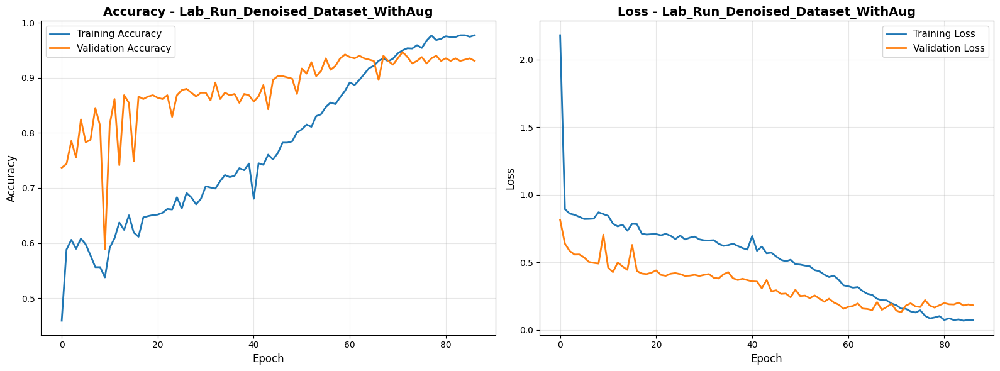

 Training plots saved

 LOADING BEST MODEL FOR EVALUATION



--- Evaluating on Test Set ---
15/15 ━━━━━━━━━━━━━━━━━━━━ 4s 203ms/step

 CLASSIFICATION REPORT

              precision    recall  f1-score   support

      glioma       0.97      0.94      0.95       201
  meningioma       0.89      0.87      0.88       119
   pituitary       0.93      1.00      0.97       152

    accuracy                           0.94       472
   macro avg       0.93      0.93      0.93       472
weighted avg       0.94      0.94      0.94       472

 Per-class metrics saved to CSV

 GENERATING CONFUSION MATRIX



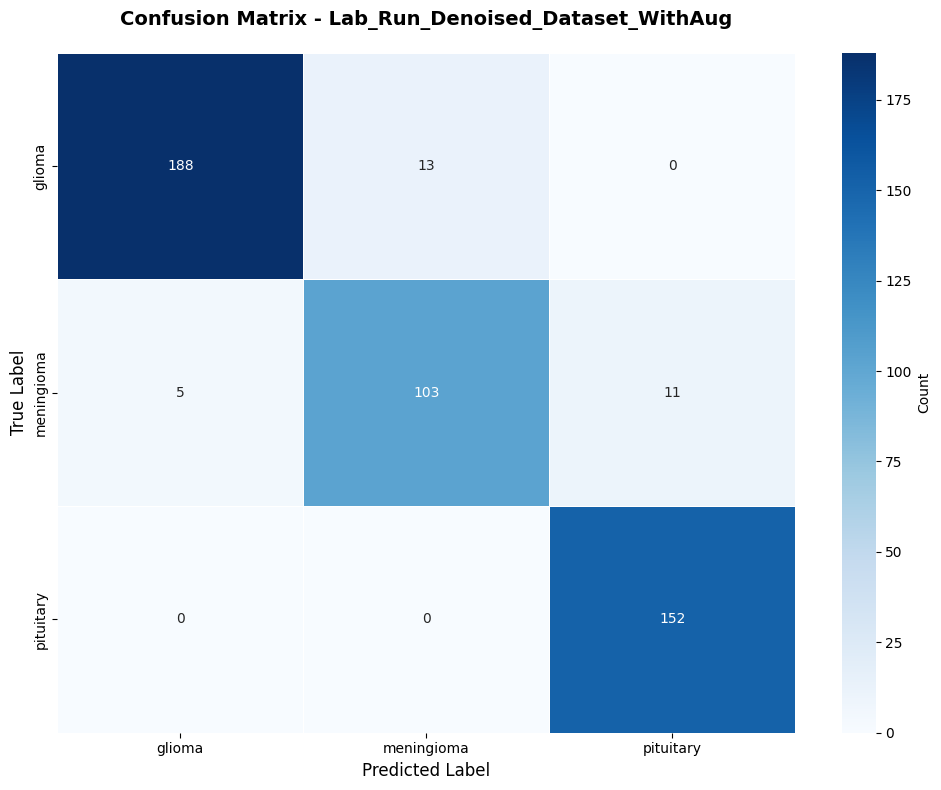

 Confusion matrix saved

 GENERATING ROC-AUC CURVES



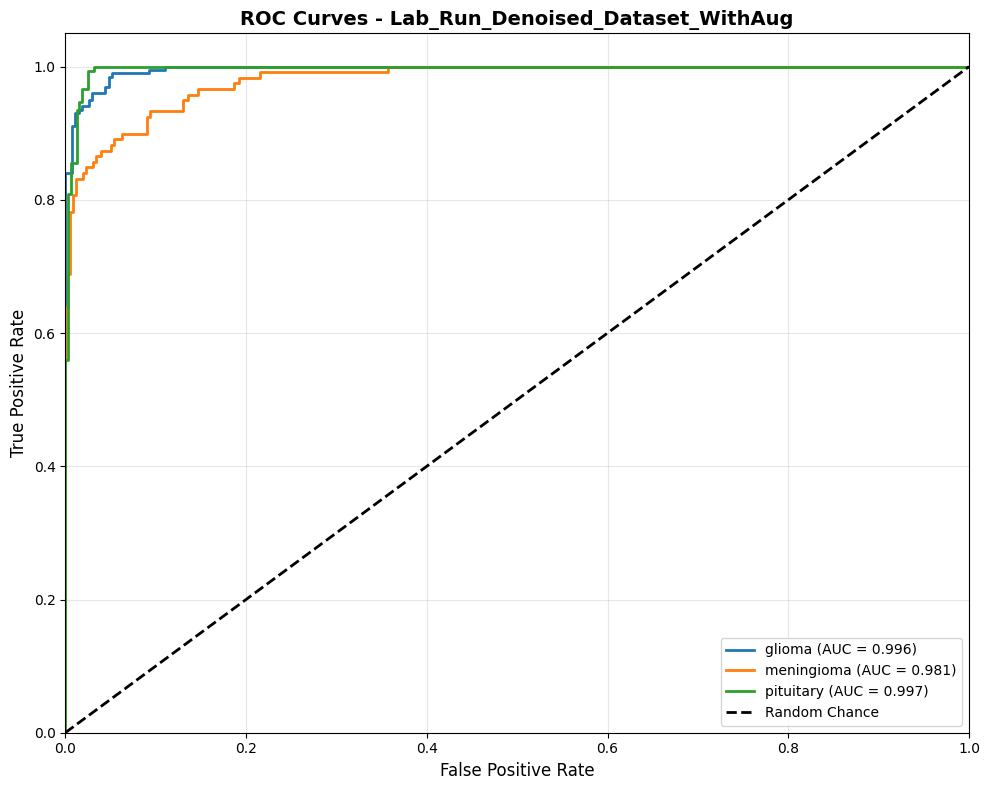

 ROC curves saved
   Mean AUC: 0.9911

 GENERATING GRAD-CAM VISUALIZATIONS

Using layer: block5_conv3

Generating 6-sample Grad-CAM grid...


/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['input_layer_3']]
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


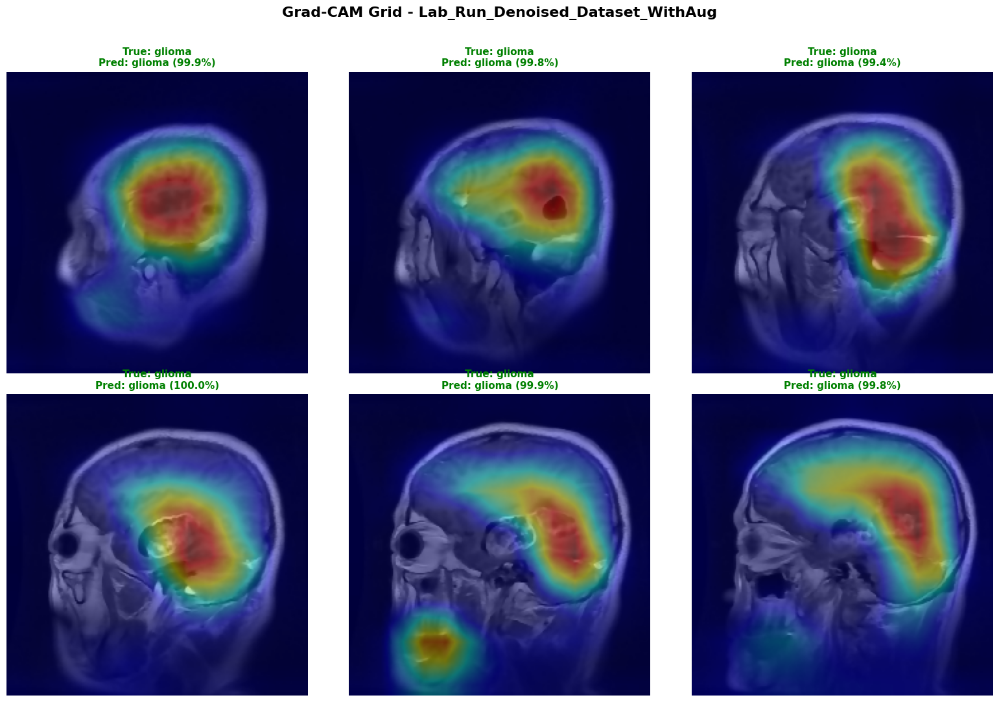

 Grad-CAM grid saved

Generating per-class Grad-CAM...


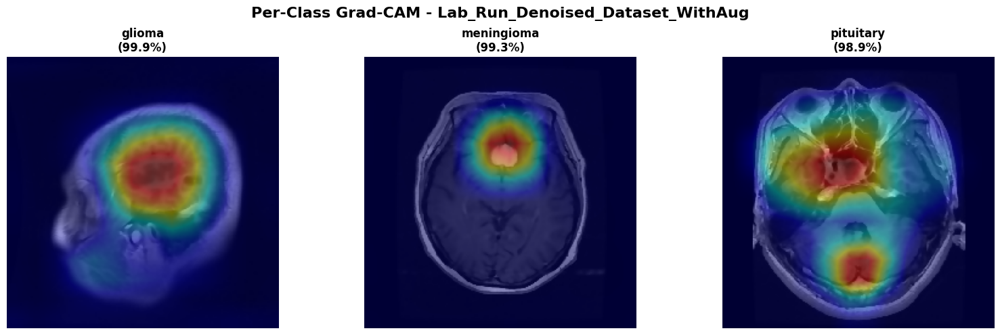

 Per-class Grad-CAM saved

 EXPERIMENT COMPLETE: Lab_Run_Denoised_Dataset_WithAug
 All results saved to: Lab_Run_Denoised_Dataset_WithAug/
 Total time: 0h 49m 31s
 Test Accuracy: 0.9386
 Mean AUC: 0.9911
 Overfitting Gap: 4.66%




In [ ]:
# RUN EXPERIMENT 8 Denoising + Augmentation
run_experiment(data_dir='Denoised_Dataset', use_augmentation=True)

In [ ]:
# =======================================================================
# FINAL CELL: ZIP AND SAVE ALL RESULTS LOCALLY
# =======================================================================
from google.colab import files
import time
import os
import shutil

# This will be the name of the file downloaded to your PC
# You might want to change this for each notebook
# e.g., 'clahe_skull_results.zip' for one, 'baseline_denoising_results.zip' for the other
ZIP_FILE_NAME = 'experiment_results_backup.zip'

print("="*80)
print(f" ZIPPING ALL 'Lab_Run_*' FOLDER S...")
print("="*80 + "\n")

# -r = recursive, -q = quiet
# This finds all folders that start with 'Lab_Run_'
!zip -rq {ZIP_FILE_NAME} Lab_Run_*

print("\n--- Zipping complete! ---")

# --- Start Local Download ---
print("\n" + "="*80)
print(" STARTING LOCAL DOWNLOAD")
print("="*80 + "\n")

print(f"Starting download for {ZIP_FILE_NAME}...")
print(" This may take a long time and can fail for large files.")
files.download(ZIP_FILE_NAME)

 ZIPPING ALL 'Lab_Run_*' FOLDER S...


--- Zipping complete! ---

 STARTING LOCAL DOWNLOAD

Starting download for experiment_results_backup.zip...
 This may take a long time and can fail for large files.


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>